### Rappel Google Colab

Tout d'abord, sélectionnez l'option GPU de Colab avec *Edit > Notebook settings* et sélectionner GPU comme Hardware accelerator. 
Installer ensuite deeplib avec la commande suivante:

In [ ]:
!pip install git+https://github.com/ulaval-damas/glo4030-labs.git

# Laboratoire 3: Optimisation

## Partie 1: Fonctions d'optimisation

Dans cette section, vous testerez différentes fonctions d'optimisation et observerez leurs effets sur l'entraînement.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.nn.init as init
import poutyne as pt

from deeplib.history import History
from deeplib.datasets import train_valid_loaders, load_cifar10

from torchvision.transforms import ToTensor

from deeplib.net import CifarNet

from deeplib.datasets import train_valid_loaders, load_mnist, load_cifar10
from deeplib.training import train, validate_ranking, test
from deeplib.visualization import show_2d_function, show_optimization, show_worst, show_random, show_best

plt.rcParams['figure.dpi'] = 150

### 1.1 Un exemple jouet

On va commencer par explorer les effets des variantes de SGD avec un exemple jouet. L'exemple jouet va consister en une régression linéaire simple en 2 dimensions avec laquelle on sera en mesure de visualiser l'impact des différentes variantes de SGD. En effet, dans cette section, on va jouer avec trois paramètres de SGD: le taux d'apprentissage, le momentum et l'accélération de Nesterov.

Initialisations notre jeu de données jouet qui va contenir seulement 3 points en 2 dimensions ainsi que 3 valeurs à régresser.

In [2]:
x = torch.tensor([[1,1],[0,-1],[2,.5]], dtype=torch.float32)
y = torch.tensor([[-1.], [3], [2]], dtype=torch.float32)

Lors d'une régression linéaire, on souhaite trouver des poids $w^*$ qui minimise pour chaque exemple $(x_i, y_i)$ la perte quadratique entre $x_i \cdot w$ et $y_i$. Mathématiquement, voici la fonction que l'on souhaite optimiser:
$$F(w) = \frac{1}{n} \sum_{i=1}^{n} (x_i \cdot w - y_i)^2$$
On souhaite donc trouver les poids optimaux $w^*$ qui minimise $F(w)$.
$$w^* = \text{argmin}_w F(w)$$
La cellule ci-dessous est cette fonction objectif en fonction des paramètres $w$ que l'on souhaite trouver.

In [3]:
def objective_function(w):
    return torch.mean((x @ w - y) ** 2, dim=0)

Comme vous vous en rappelez peut-être, la solution d'une régression linéaire a une forme analytique qui est la suivante.
$$w^* = (X^TX)^{-1}X^TY$$
La cellule ci-dessous trouve la solution pour notre problème jouet en utilisant cette formule.

In [4]:
w_opt = torch.inverse(x.T @ x) @ x.T @ y

Nous allons utiliser la fonction `show_2d_function` de la librairie `deeplib`. La librairie `deeplib` est une libraire écrite spécialement pour les notebook de ce cours. La fonction `show_2d_function` permet de visualiser notre fonction objectif avec des courbes de niveau. Les deux axes correspondent à différentes valeurs pour les 2 poids respectifs de $w$ pour notre régression linéaire en 2 dimensions. La couleur des courbes de niveau donne la valeur de la fonction objectif. L'étoile rouge correspond à $w^*$, notre valeur optimale des poids.

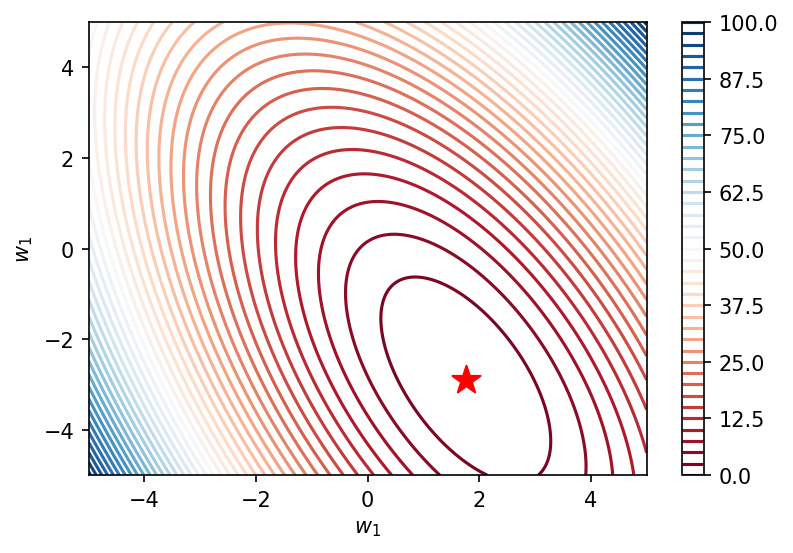

In [5]:
show_2d_function(objective_function, optimal=w_opt)

Les prochaines cellules définissent deux fonctions. 

La première fonction se charge d'optimiser notre fonction objectif à la manière des réseaux de neurones en utilisant l'optimiseur SGD de PyTorch. La fonction retourne l'historique des poids $w$ de chaque itération ainsi que l'historique des valeurs de perte. Des commentaires dans cette fonction ont été laissés afin que vous puissiez comprendre le déroulement de l'optimisation.

In [6]:
def optimize(learning_rate, momentum, nesterov, nb_iter=20):
    """
    Optimise la fonction objectif à la manière de PyTorch avec l'optimiseur SGD.
    
    Args:
        learning_rate: Le taux d'apprentissage.
        momentum: La valeur du momentum.
        nesterov: Si l'accélération de Nesterov est désirée.
        nb_iter: Le nombre d'itérations effectué.
    
    Returns:
        Tuple `(w_history, loss_history)` où `w_history` correspond à 
        l'historique des poids lors de l'optimisation et `loss_history`
        correspond à l'historique de la valeur de la fonction objectif 
        ou fonction de perte dans le cadre des réseaux de neurones.
    """
    torch.manual_seed(42)
    
    # Notre réseau: une couche linéaire sans biais. Essentiellement, 2 poids.
    neuron = nn.Linear(2, 1, bias=False)
    
    # La fonction de perte quadratique.
    loss_function = nn.MSELoss()
    
    # Initialise l'optimiseur SGD
    optimizer = optim.SGD(neuron.parameters(), lr=learning_rate, momentum=momentum, nesterov=nesterov)

    # À la différence des réseaux de neurones, on ne divise pas en epochs
    # et en batchs étant donné que notre jeu de données contient seulement
    # 3 points et que notre problème est convexe et donc résoluble avec une
    # simple descente de gradient. On fera donc un certain nombre d'itérations
    # pour trouver la solution du problème. On pourrait voir une itération comme 
    # un epoch avec une seule batch contenant le jeu de données entier.
    # Pour chaque itération, on y va à 
    # la manière des réseaux de neurones:
    # - On effectue une prédiction;
    # - On calcule notre perte;
    # - On fait la rétropropagation (backpropagation) via la méthode backward();
    # - On met à jour les poids avec l'optimiseur.
    w_history = []
    loss_history = []
    for t in range(nb_iter):
        y_pred = neuron(x)
        loss = loss_function(y_pred, y)         
        w_history.append(neuron.weight.squeeze(0).detach().clone().numpy())
        loss_history.append(loss.item())

        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        
    return w_history, loss_history

La deuxième fonction trace des graphiques permettant de visualiser l'optimisation effectuée par la première fonction. La fonction ne fait qu'appeler la fonction `show_optimization` définie dans `deeplib` en lui passant en paramètre les historiques retournées par la fonction d'optimisation, la fonction objectif ainsi que les paramètres optimaux que nous avons calculés. 

In [7]:
def show_objective_optimization(w_history, loss_history, **kwargs):
    return show_optimization(w_history, loss_history, objective_function, optimal=w_opt, **kwargs)

On va utiliser ces deux fonctions pour pouvoir visualiser l'impact de trois paramètres de SGD: le taux d'apprentissage, le momentum et l'accélération de Nesterov.

In [8]:
learning_rate = 0.3
momentum = 0
nesterov = False

Optimisons maintenant notre fonction avec les valeurs ci-dessus.

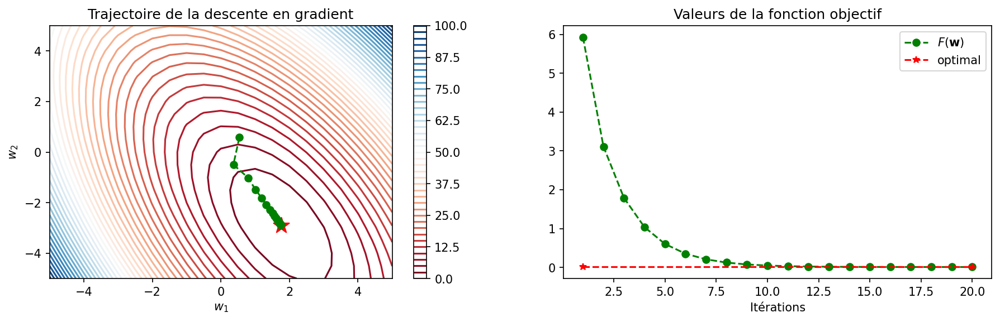

In [9]:
w_history, loss_history = optimize(learning_rate, momentum, nesterov)
show_objective_optimization(w_history, loss_history)

On voit qu'après 10 itérations, l'optimisation a relativement convergé.

#### Exercices

Pour les exercices ci-dessous, vous pouvez utiliser des fonctions comme [`numpy.linspace`](https://numpy.org/doc/stable/reference/generated/numpy.linspace.html), [`numpy.logspace`](https://numpy.org/doc/stable/reference/generated/numpy.logspace.html) ou [`numpy.geomspace`](https://numpy.org/doc/stable/reference/generated/numpy.geomspace.html) permettant d'obtenir une liste de valeurs à tester.

- Testez différentes valeurs entre 0 et 1 du taux d'apprentissage en complétant la cellule ci-dessous.

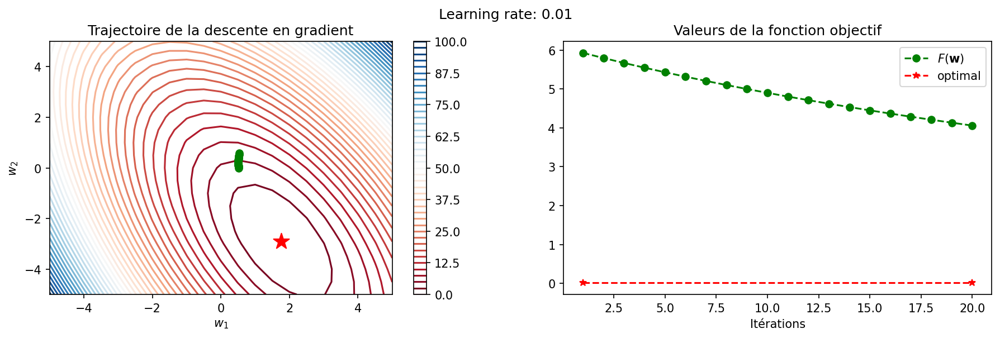

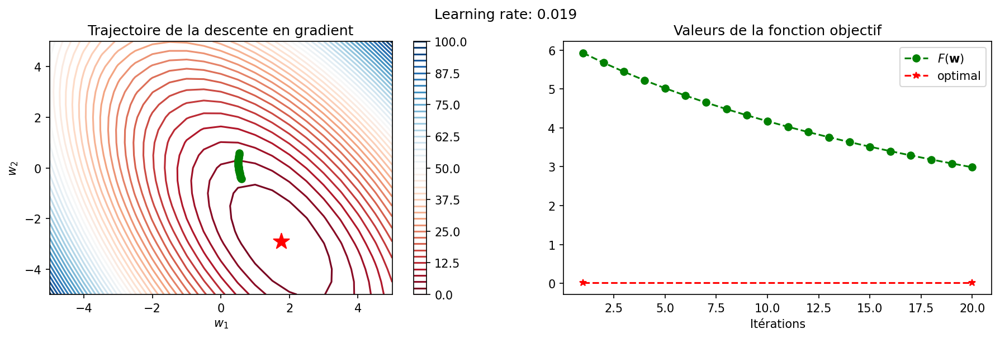

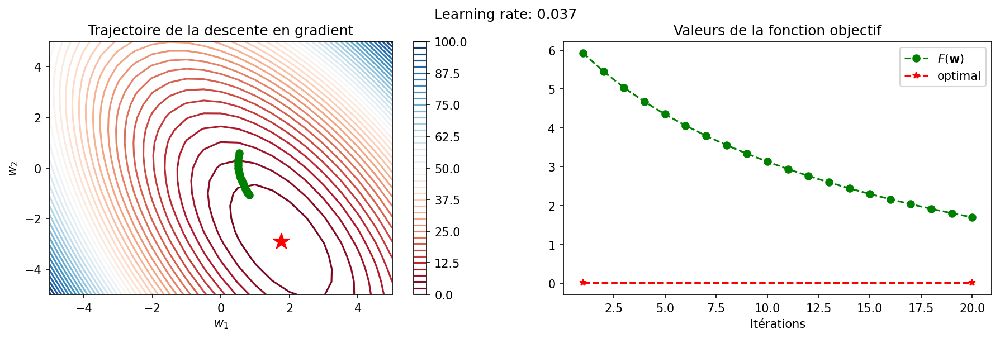

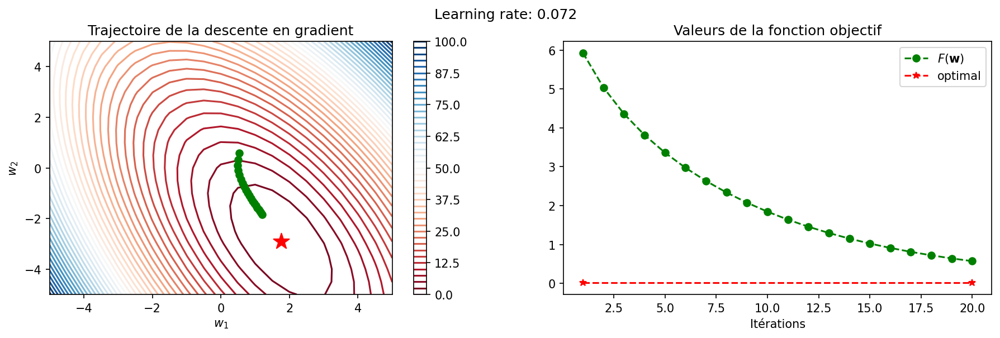

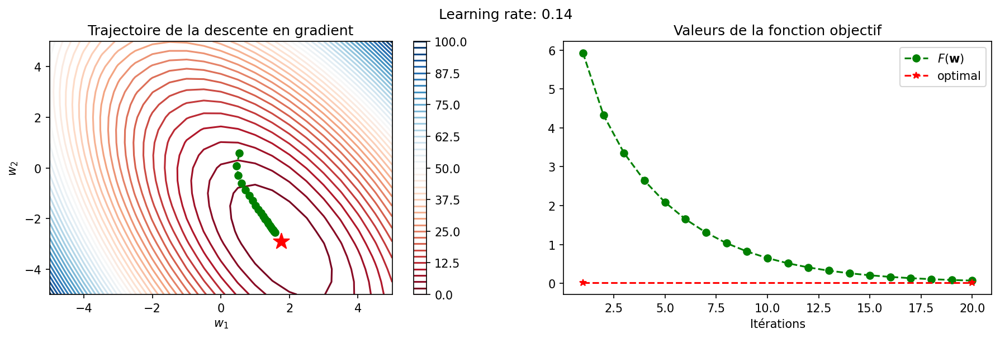

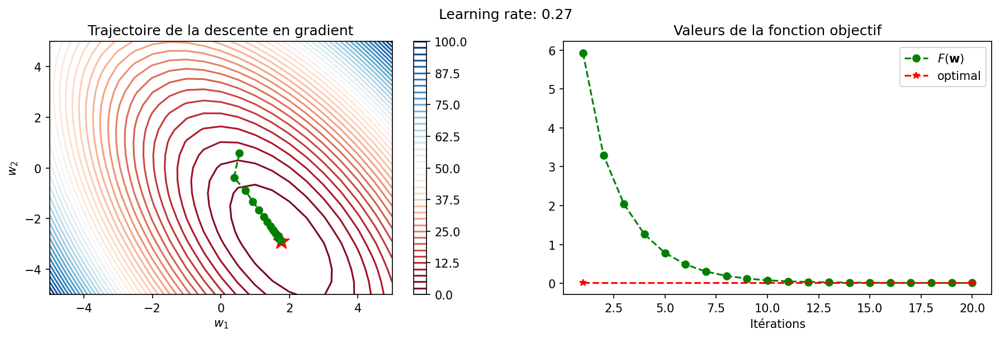

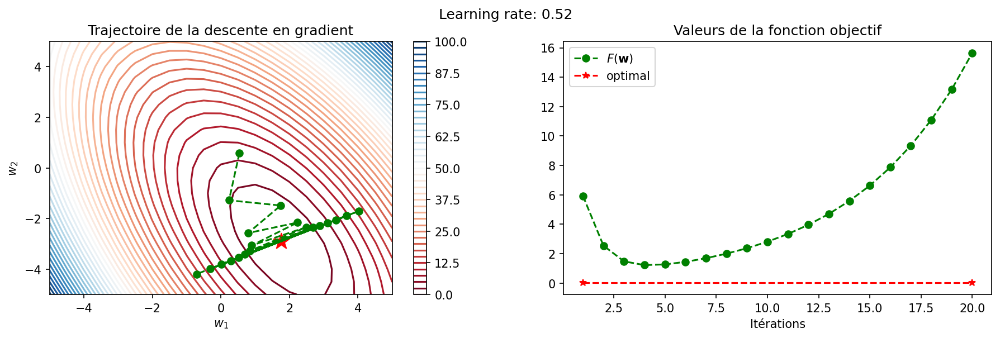

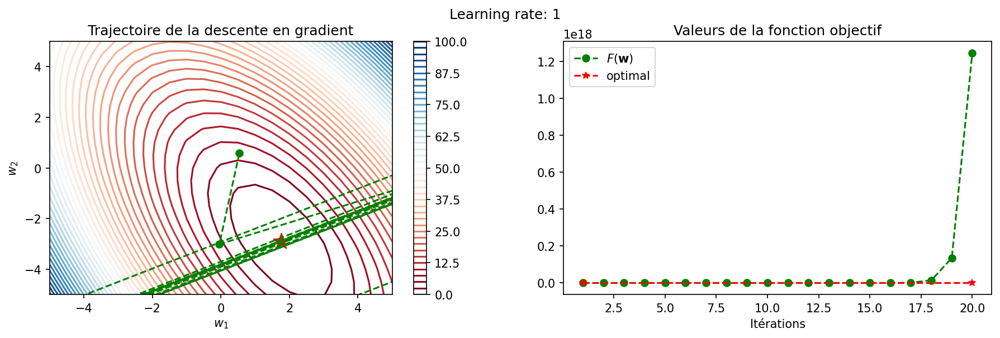

In [10]:
momentum = 0.
nesterov = False
#for learning_rate in [...]: # TODO à compléter avec différentes valeurs
for learning_rate in np.geomspace(0.01, 1., 8):
    w_history, loss_history = optimize(learning_rate, momentum, nesterov)
    show_objective_optimization(w_history, loss_history, title=f"Learning rate: {learning_rate:.2g}")

- Testez différentes valeurs entre 0 et 1 pour le momentum en complétant la cellule ci-dessous.

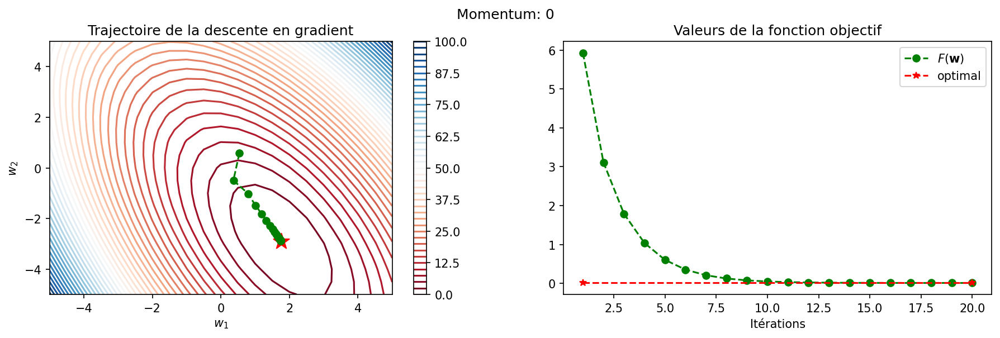

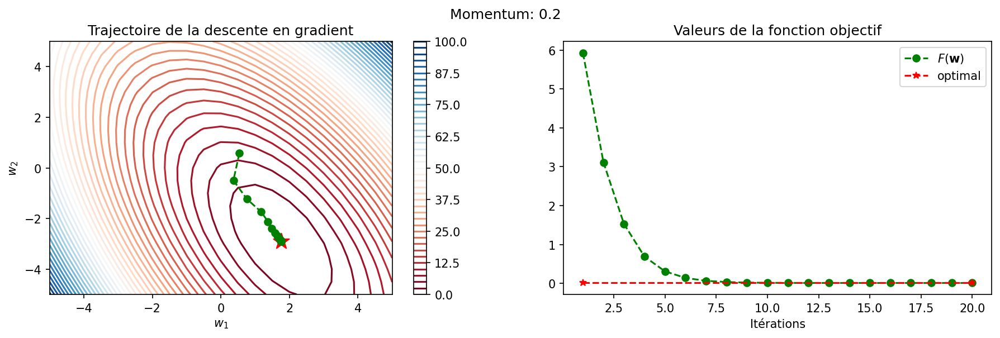

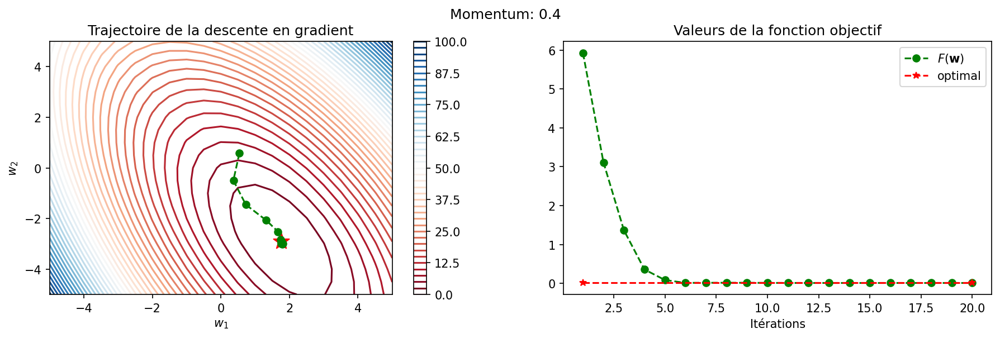

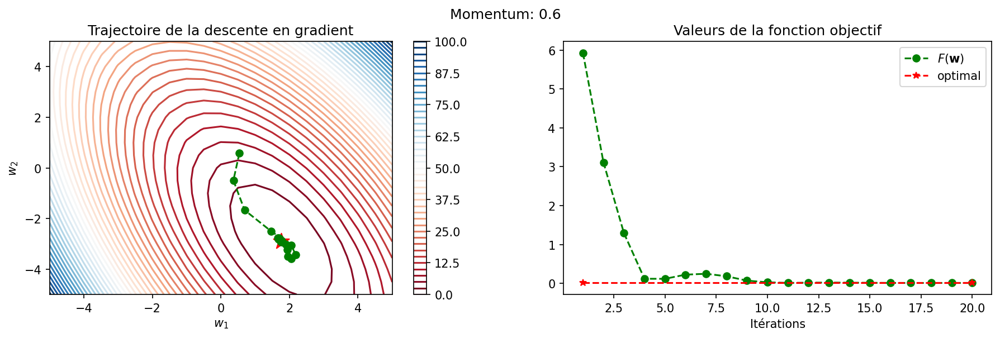

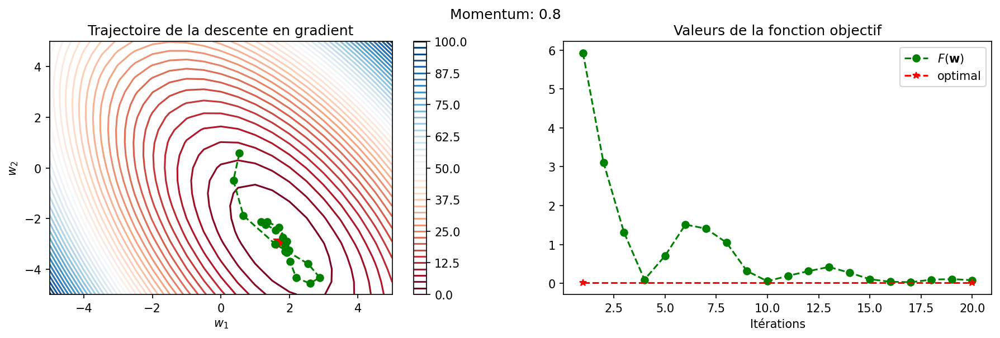

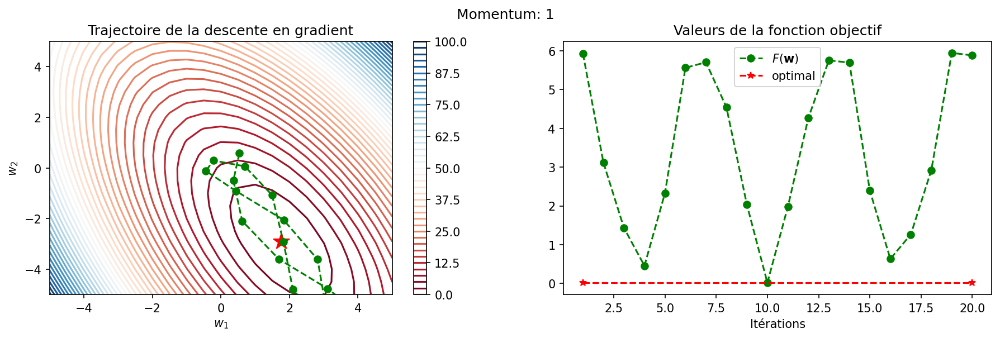

In [11]:
learning_rate = 0.3
nesterov = False
#for momentum in [...]: # TODO à compléter avec différentes valeurs
for momentum in np.linspace(0., 1., 6):
    w_history, loss_history = optimize(learning_rate, momentum, nesterov)
    show_objective_optimization(w_history, loss_history, title=f"Momentum: {momentum:.2g}")

- Testez différentes valeurs entre 0 et 1 pour le momentum avec l'accélération de Nesterov en complétant la cellule ci-dessous.

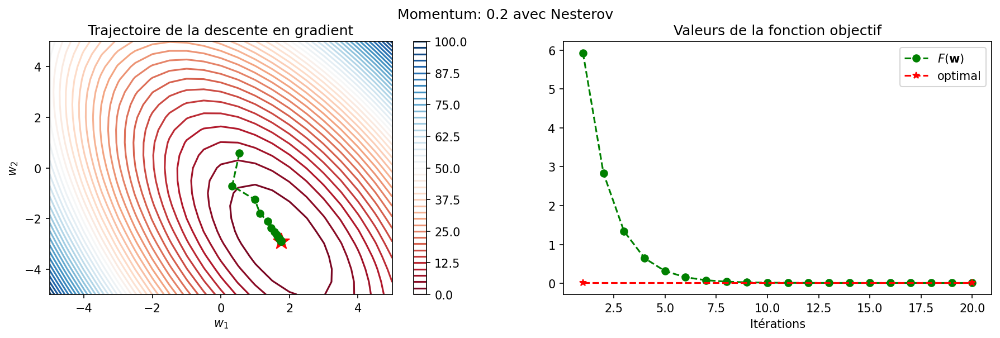

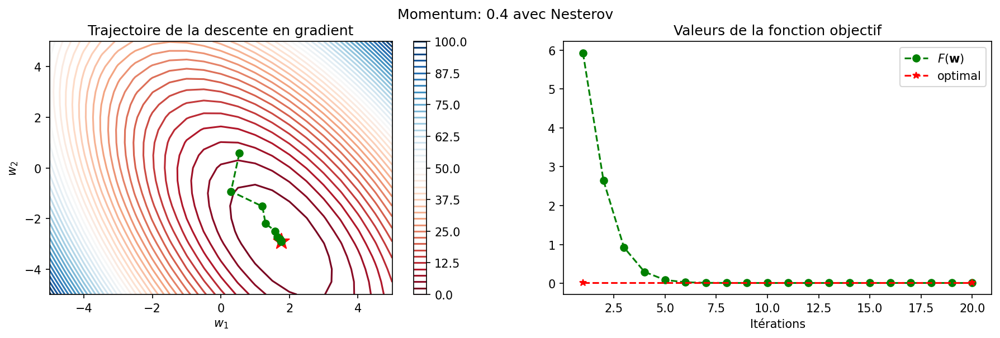

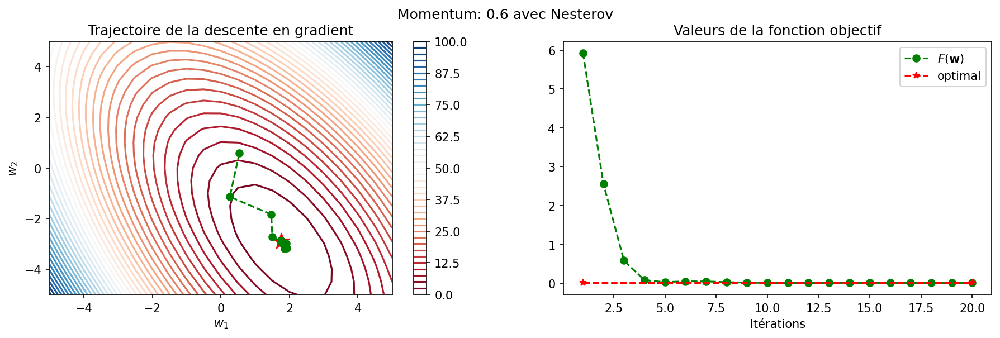

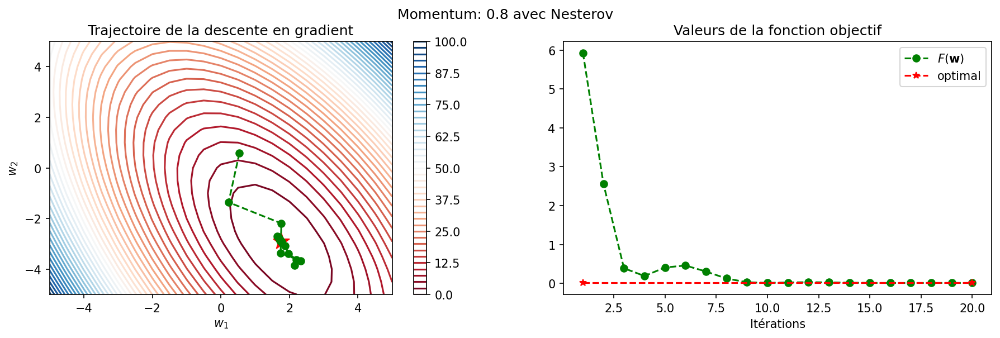

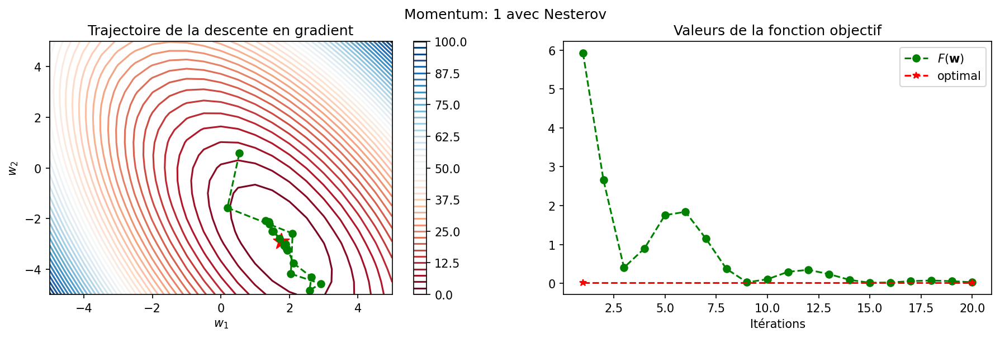

In [12]:
learning_rate = 0.3
nesterov = True
#for momentum in [...]: # TODO à compléter avec différentes valeurs
for momentum in np.linspace(0.2, 1., 5):
    w_history, loss_history = optimize(learning_rate, momentum, nesterov)
    show_objective_optimization(w_history, loss_history, title=f"Momentum: {momentum:.2g} avec Nesterov")

#### Questions
- Que pouvons-nous remarquer sur l'impact du taux d'apprentissage sur l'optimisation? 

    **Si le taux d'apprentissage est trop petit ou trop grand, l'apprentissage ne se fera pas. Dans ce cas, on est dans un régime de sous-apprentissage (*underfitting*). Lorsque le taux est trop petit, les poids ne bougent pas suffisamment dans l'espace des poids pour obtenir une bonne solution. Si le taux est trop grand, les poids vont diverger complètement. Également, si le taux n'est ni trop petit ni trop grand, la vitesse de convergence va changer en fonction du taux.**

- Que pouvons-nous remarquer sur l'impact du momentum sur l'optimisation? 

    **Dans la solution donnée ici, on remarque qu'avec un momentum de 0.6, on est capable d'être assez près de l'optimal en seulement 3 itérations. Autrement, un momentum plus petit prend plus de temps à converger. Un momentum trop grand va sans cesse diverger pour reconverger par la suite par la nature du momentum.**

- Que pouvons-nous remarquer sur l'impact de l'accélération de Nesterov sur l'optimisation? 

    **On remarque que l'accélération de Nesterov tempère de beaucoup le momentum. Même avec une valeur de 1, l'accélération de Nesterov permet de converger alors que ce n'était pas le cas sans l'accélération de Nesterov.**

### 1.2 Un exemple plus près de la réalité

Testons maintenant différents optimiseurs sur un vrai réseau de neurones avec un vrai jeu de données. Comme dans les labos précédents, on utilise le jeu de données CIFAR10 avec un simple réseau à convolution.

Initialisons le jeu de données et quelques hyperparamètres qui vont rester constants.

In [13]:
cifar_train, cifar_test = load_cifar10()

Files already downloaded and verified
Files already downloaded and verified


In [14]:
batch_size = 128
lr = 0.01
n_epoch = 5

Pour le reste de ce notebook et dans les prochains laboratoires, nous allons utiliser la fonction `train` qui est définie dans la librairie `deeplib`. La fonction utilise la librairie [Poutyne](https://poutyne.org). Comme vu dans le laboratoire 1, Poutyne nous donne un meilleur affichage de l'évolution de l'entraînement comparativement à notre boucle d'entraînement personnalisée que nous avions fait à la main. Comme on va le voir plus loin, l'utilisation de Poutyne implique nous allons devoir utiliser des callbacks de Poutyne pour les horaires d'entraînement.

#### Exercice

 - Comparez trois différentes stratégies d'optimisation:
1. [SGD](http://pytorch.org/docs/master/optim.html#torch.optim.SGD)
2. SGD + Momentum accéléré de Nesterov
3. [Adam](http://pytorch.org/docs/master/optim.html#torch.optim.Adam)

Commençons par l'entraîner avec SGD (sans momentum ni accélération de Nesterov).

Epoch: 1/5 Step:   8/313   2.56% |▌                   |ETA: 4.51s loss: 2.303118 acc: 11.718750

/home/fredy/.venv/base/lib/python3.8/site-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Epoch: 1/5 Train steps: 313 Val steps: 79 5.46s loss: 2.297451 acc: 12.737500 val_loss: 2.288542 val_acc: 18.240000
Epoch: 2/5 Train steps: 313 Val steps: 79 5.49s loss: 2.232653 acc: 22.540000 val_loss: 2.082372 val_acc: 25.990000
Epoch: 3/5 Train steps: 313 Val steps: 79 5.53s loss: 2.015580 acc: 27.910000 val_loss: 1.973524 val_acc: 30.280000
Epoch: 4/5 Train steps: 313 Val steps: 79 5.45s loss: 1.917718 acc: 32.390000 val_loss: 1.885343 val_acc: 32.790000
Epoch: 5/5 Train steps: 313 Val steps: 79 5.47s loss: 1.829035 acc: 35.632500 val_loss: 1.900411 val_acc: 33.270000


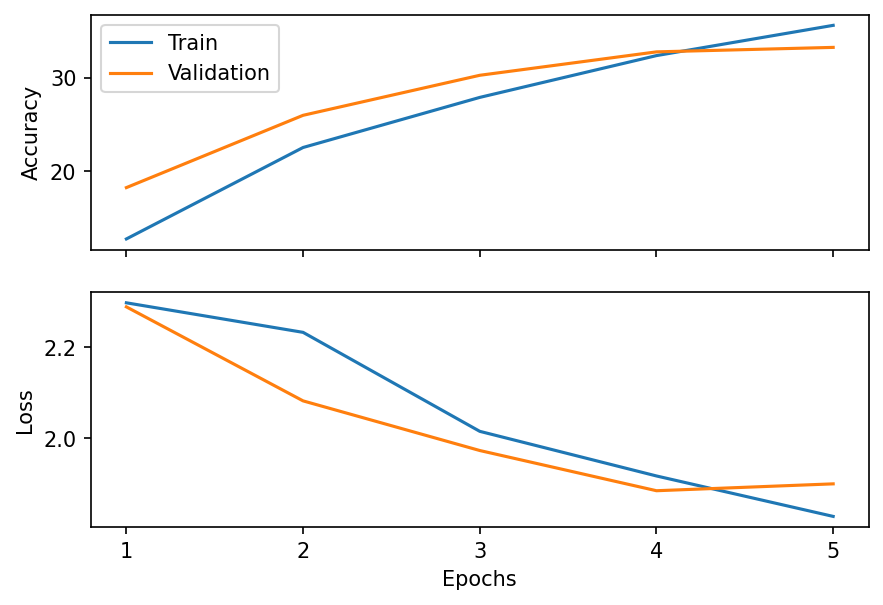

Test steps: 79 0.95s test_loss: 1.904097 test_acc: 32.950000                                                
Exactitude en test: 32.95


In [15]:
model = CifarNet()
model.cuda()
optimizer = optim.SGD(model.parameters(), lr=lr)
history_sgd = train(model, optimizer, cifar_train, n_epoch, batch_size, use_gpu=True)
history_sgd.display()
print('Exactitude en test: {:.2f}'.format(test(model, cifar_test, batch_size)))

 - Complétez cette cellule pour entraîner avec SGD + Momentum accéléré de Nesterov. Utilisez un momentum de 0.9.

Epoch: 1/5 Train steps: 313 Val steps: 79 5.46s loss: 1.882962 acc: 32.330000 val_loss: 1.585321 val_acc: 43.740000
Epoch: 2/5 Train steps: 313 Val steps: 79 5.51s loss: 1.423819 acc: 49.815000 val_loss: 1.289104 val_acc: 54.500000
Epoch: 3/5 Train steps: 313 Val steps: 79 5.48s loss: 1.221629 acc: 57.070000 val_loss: 1.168190 val_acc: 58.570000
Epoch: 4/5 Train steps: 313 Val steps: 79 5.49s loss: 1.078284 acc: 62.487500 val_loss: 1.057085 val_acc: 62.720000
Epoch: 5/5 Train steps: 313 Val steps: 79 5.48s loss: 0.963565 acc: 66.690000 val_loss: 1.027818 val_acc: 64.620000


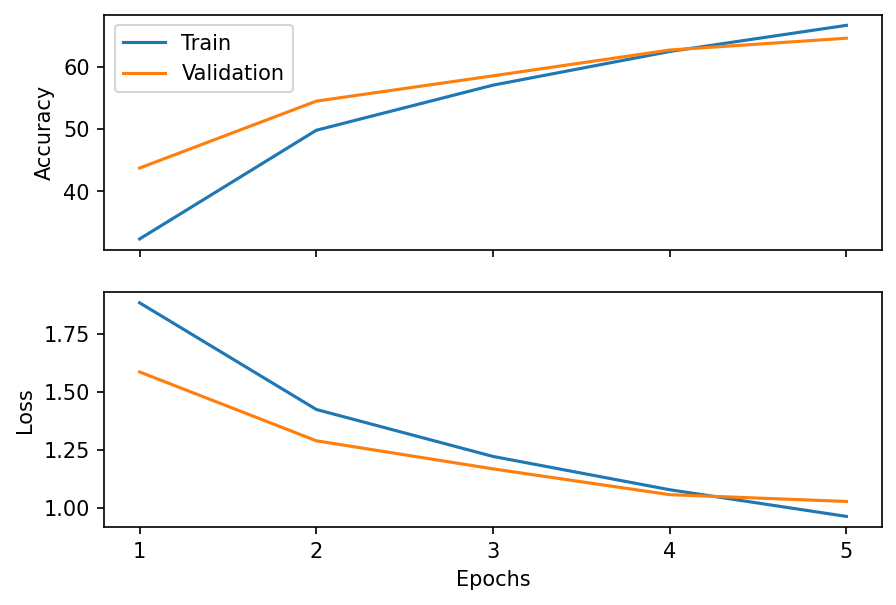

Test steps: 79 0.96s test_loss: 1.022991 test_acc: 64.300000                                                
Exactitude en test: 64.30


In [16]:
model = CifarNet()
model.cuda()
#optimizer =
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9, nesterov=True)
history_SGDMN = train(model, optimizer, cifar_train, n_epoch, batch_size, use_gpu=True)
history_SGDMN.display()
print('Exactitude en test: {:.2f}'.format(test(model, cifar_test, batch_size)))

 - Complétez cette cellule pour entraîner avec Adam

Epoch: 1/5 Train steps: 313 Val steps: 79 5.49s loss: 1.884349 acc: 32.480000 val_loss: 1.618523 val_acc: 41.050000
Epoch: 2/5 Train steps: 313 Val steps: 79 5.46s loss: 1.561188 acc: 43.517500 val_loss: 1.502645 val_acc: 45.650000
Epoch: 3/5 Train steps: 313 Val steps: 79 5.48s loss: 1.437496 acc: 48.317500 val_loss: 1.401354 val_acc: 49.340000
Epoch: 4/5 Train steps: 313 Val steps: 79 5.50s loss: 1.378633 acc: 50.805000 val_loss: 1.446461 val_acc: 49.330000
Epoch: 5/5 Train steps: 313 Val steps: 79 5.56s loss: 1.344193 acc: 51.880000 val_loss: 1.366569 val_acc: 51.960000


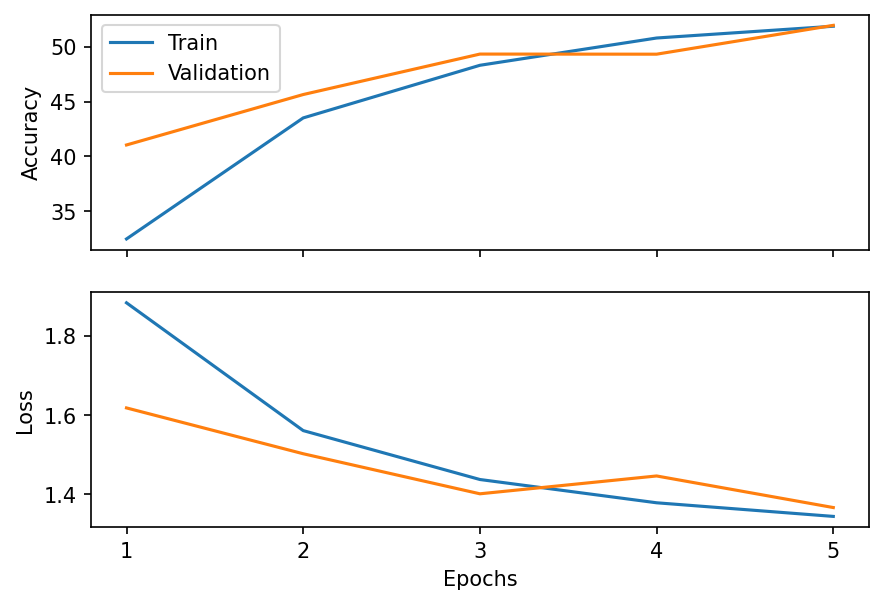

Test steps: 79 0.95s test_loss: 1.353930 test_acc: 51.400000                                                
Exactitude en test: 51.40


In [17]:
model = CifarNet()
model.cuda()
#optimizer =
optimizer = optim.Adam(model.parameters(), lr=lr)
history_adam = train(model, optimizer, cifar_train, n_epoch, batch_size, use_gpu=True)
history_adam.display()
print('Exactitude en test: {:.2f}'.format(test(model, cifar_test, batch_size)))

#### Questions
- Quelle méthode semble être la meilleure dans ce cas-ci? 

    **Les résultats peuvent varier en fonction de l'initialisation. Dans ce solutionnaire, on remarque que l'exactitude en validation et en test de SGD + Momentum accéléré de Nesterov est la meilleure suivi de Adam qui est très proche de SGD seul.**

- Remarquez-vous une différence d'overfitting? 

    **On remarque une grande différence entre les pertes d'entraînement et de validation pour SGD + Momentum accéléré de Nesterov alors que la différence est quasiment nulle pour SGD alors que Adam est entre les deux. Encore une fois, les résultats peuvent varier en fonction de l'initialisation.**

- Dans une nouvelle cellule, changez le taux d'apprentissage de Adam pour 0.001. Que remarquez-vous maintenant?

    **On remarque que les paramètres des optimiseurs sont également importants et qu'un taux d'apprentissage qui fonctionne bien pour un optimiseur ne fonctionnera pas nécessairement aussi bien pour un autre optimiseur. Avec le taux d'apprentissage de 0.001 pour Adam, on observe que les métriques sont aussi bonnes sinon meilleures qu'avec SGD + Momentum accéléré de Nesterov.**

    **Il est à noter que si l'on changeait l'architecture, les données, la tâche ou tout autre hyperparamètre, la performance des optimiseurs va varier.**

Pour la réponse à la question 3:

Epoch: 1/5 Train steps: 313 Val steps: 79 5.56s loss: 1.653518 acc: 40.995000 val_loss: 1.413882 val_acc: 50.100000
Epoch: 2/5 Train steps: 313 Val steps: 79 5.54s loss: 1.309136 acc: 53.845000 val_loss: 1.235909 val_acc: 56.480000
Epoch: 3/5 Train steps: 313 Val steps: 79 5.43s loss: 1.147211 acc: 59.845000 val_loss: 1.148770 val_acc: 59.610000
Epoch: 4/5 Train steps: 313 Val steps: 79 5.47s loss: 1.029971 acc: 64.210000 val_loss: 1.061670 val_acc: 62.900000
Epoch: 5/5 Train steps: 313 Val steps: 79 5.48s loss: 0.939996 acc: 67.390000 val_loss: 0.987950 val_acc: 65.430000


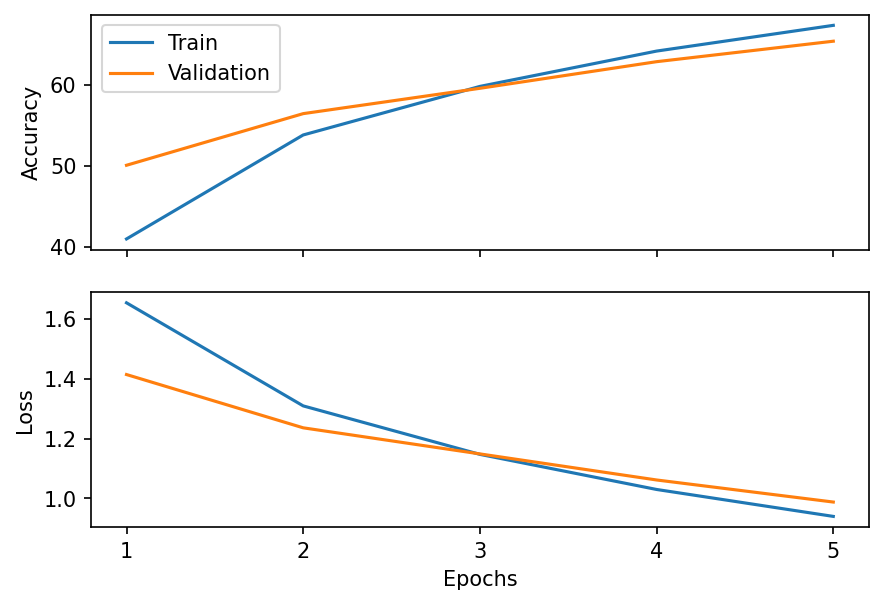

Test steps: 79 0.93s test_loss: 0.985629 test_acc: 65.230000                                                
Exactitude en test: 65.23


In [18]:
model = CifarNet()
model.cuda()
#optimizer =
optimizer = optim.Adam(model.parameters(), lr=0.001)
history_adam = train(model, optimizer, cifar_train, n_epoch, batch_size, use_gpu=True)
history_adam.display()
print('Exactitude en test: {:.2f}'.format(test(model, cifar_test, batch_size)))

## Partie 2: Horaire d'entraînement

Une pratique courante utilisée en apprentissage profond est de faire diminuer le taux d'apprentissage pendant l'entraînement.

Pour ce faire, PyTorch fournit plusieurs fonctions (ExponentialLR, LambdaLR, MultiStepLR, etc.).  Dans ce notebook, on utilisera les [callbacks correspondant de Poutyne](https://poutyne.org/callbacks.html#lr-schedulers) qui cachent sous le capot les fonctions de PyTorch.

Voici un exemple avec ExponentialLR.

In [19]:
model = CifarNet()
model.cuda()

batch_size = 128
lr = 0.01
n_epoch = 10

optimizer = optim.SGD(model.parameters(), lr=lr)

gamma = 0.8
scheduler = pt.ExponentialLR(gamma)

history = train(model, optimizer, cifar_train, n_epoch, batch_size, callbacks=[scheduler], use_gpu=True)

Epoch:  1/10 Train steps: 313 Val steps: 79 5.46s loss: 2.271265 acc: 15.395000 val_loss: 2.178629 val_acc: 20.640000
Epoch:  2/10 Train steps: 313 Val steps: 79 5.47s loss: 2.048639 acc: 26.612500 val_loss: 2.006924 val_acc: 28.450000
Epoch:  3/10 Train steps: 313 Val steps: 79 5.48s loss: 1.954391 acc: 30.212500 val_loss: 1.920091 val_acc: 32.940000
Epoch:  4/10 Train steps: 313 Val steps: 79 5.45s loss: 1.897536 acc: 33.100000 val_loss: 1.866792 val_acc: 34.980000
Epoch:  5/10 Train steps: 313 Val steps: 79 5.49s loss: 1.851394 acc: 34.972500 val_loss: 1.828901 val_acc: 36.590000
Epoch:  6/10 Train steps: 313 Val steps: 79 5.51s loss: 1.811001 acc: 36.520000 val_loss: 1.796398 val_acc: 37.160000
Epoch:  7/10 Train steps: 313 Val steps: 79 5.43s loss: 1.777958 acc: 37.810000 val_loss: 1.766279 val_acc: 37.890000
Epoch:  8/10 Train steps: 313 Val steps: 79 5.44s loss: 1.751281 acc: 38.700000 val_loss: 1.748158 val_acc: 38.350000
Epoch:  9/10 Train steps: 313 Val steps: 79 5.43s loss: 

Affichons la valeur du taux d'apprentissage.

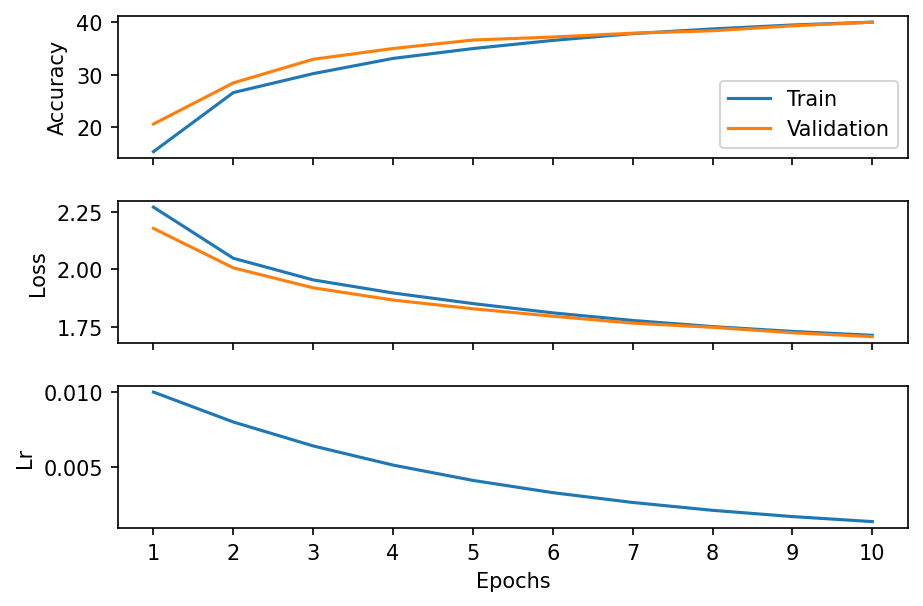

In [20]:
history.display(display_lr=True)

#### Exercice

- Utilisez [MultiStepLR](http://pytorch.org/docs/master/optim.html#torch.optim.lr_scheduler.MultiStepLR) pour modifier le taux d'apprentissage pour un epoch précis.

1. Commencez avec un taux d'apprentissage trop élevé pour que le réseau puisse apprendre quelque chose.
2. Diminuez-le progressivement jusqu'à ce que le réseau apprenne.
3. Trouvez le moment où la validation semble avoir atteint un plateau.
4. Diminuez le taux par 2 à ce moment et réentraîner le réseau.

In [21]:
torch.manual_seed(42)
model = CifarNet()
model.cuda()

#epoch_list = []
epoch_list = [8, 11, 12]

batch_size = 128
#lr = 10
lr = 0.5
n_epoch = 20

optimizer = optim.SGD(model.parameters(), lr=lr)
scheduler = pt.MultiStepLR(milestones=epoch_list, gamma=0.5, verbose=True)

history = train(model, optimizer, cifar_train, n_epoch, batch_size, callbacks=[scheduler], use_gpu=True)

Adjusting learning rate of group 0 to 5.0000e-01.
Epoch:  1/20 Train steps: 313 Val steps: 79 5.45s loss: 2.141239 acc: 20.560000 val_loss: 2.010528 val_acc: 27.950000
Adjusting learning rate of group 0 to 5.0000e-01.
Epoch:  2/20 Train steps: 313 Val steps: 79 5.54s loss: 1.764962 acc: 37.067500 val_loss: 1.640317 val_acc: 41.910000
Adjusting learning rate of group 0 to 5.0000e-01.
Epoch:  3/20 Train steps: 313 Val steps: 79 5.53s loss: 1.552357 acc: 45.520000 val_loss: 1.554287 val_acc: 45.860000
Adjusting learning rate of group 0 to 5.0000e-01.
Epoch:  4/20 Train steps: 313 Val steps: 79 5.47s loss: 1.401920 acc: 51.335000 val_loss: 1.437078 val_acc: 49.790000
Adjusting learning rate of group 0 to 5.0000e-01.
Epoch:  5/20 Train steps: 313 Val steps: 79 5.53s loss: 1.302628 acc: 54.832500 val_loss: 1.522447 val_acc: 47.110000
Adjusting learning rate of group 0 to 5.0000e-01.
Epoch:  6/20 Train steps: 313 Val steps: 79 5.50s loss: 1.219736 acc: 57.707500 val_loss: 1.434990 val_acc: 51

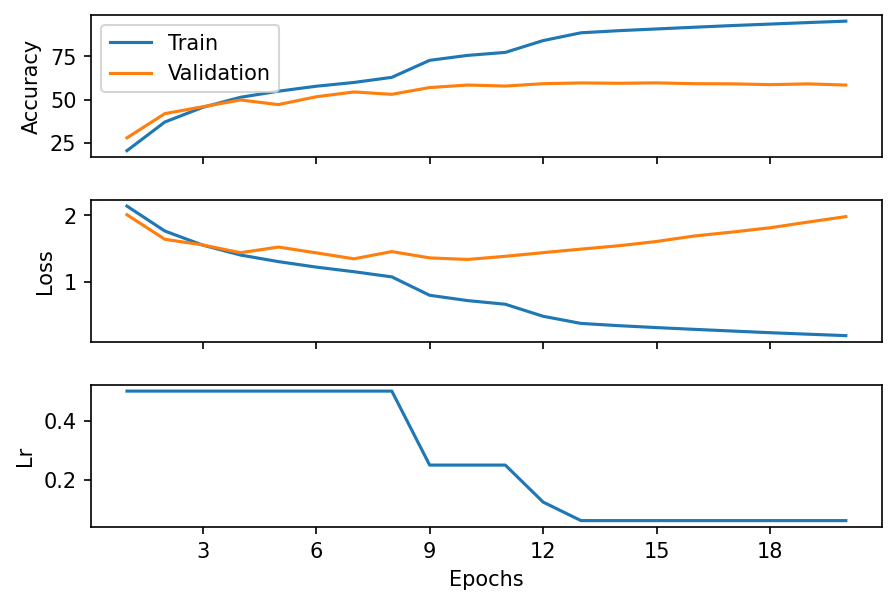

In [22]:
history.display(display_lr=True)

#### Questions
- Voyez-vous une différence en diminuant le taux d'apprentissage par 2 après x epochs? 

    **Dans l'exécution de ce solutionnaire, on peut voir une diminution significative de la perte en entraînement ainsi qu'une augmentation significative de l'exactitude en entraînement lorsque l'on diminue le taux d'apprentissage à des moments clés. On peut faire un constat similaire pour la validation mais dans une moindre mesure.**

- Pourquoi? 

    **Réduire le taux d'apprentissage du réseau de neurones lorsque l'apprentissage stagne permet à l'optimisation de se concentrer plus spécifiquement sur l'espace de paramètres actuel qui est relativement bon au lieu de continuer à visiter l'espace de manière plus large. Dans le jargon, on peut dire que l'on vient faire une exploration plus locale. C'est donc normal d'obtenir une légère amélioration au niveau des métriques.**

### Pour aller plus loin sur les horaires d'entraînement

On vient de faire "à la main" ce que la classe [ReduceLROnPlateau](https://pytorch.org/docs/stable/optim.html#torch.optim.lr_scheduler.ReduceLROnPlateau) de PyTorch nous permet de faire automatiquement. Essentiellement, cette classe nous permet de monitorer une métrique et de réduire le taux d'apprentissage lorsque cette métrique stagne pour un certain nombre d'epochs. Ce nombre d'epoch est appelé la "patience". Nous allons utiliser le callback [poutyne.ReduceLROnPlateau](https://poutyne.org/callbacks.html#poutyne.ReduceLROnPlateau) de Poutyne qui prend en paramètre le nom de la métrique à monitorer en plus des autres arguments de la classe de PyTorch.

Notez bien la description du paramètre `patience` dans la documentation de PyTorch:
> **patience** - Number of epochs with no improvement after which learning rate will be reduced. For example, if patience = 2, then we will ignore the first 2 epochs with no improvement, and will only decrease the LR after the 3rd epoch if the loss still hasn’t improved then.

Dans la cellule ci-dessous, on monitore l'exactitude en validation avec une patience de 1 epoch.

In [23]:
torch.manual_seed(42)
model = CifarNet()
model.cuda()

batch_size = 128
lr = 0.5
n_epoch = 20

optimizer = optim.SGD(model.parameters(), lr=lr)
scheduler = pt.ReduceLROnPlateau(monitor='val_acc', mode='max', patience=1, factor=0.5, verbose=True)

history = train(model, optimizer, cifar_train, n_epoch, batch_size, callbacks=[scheduler], use_gpu=True)

Epoch:  1/20 Train steps: 313 Val steps: 79 5.49s loss: 2.281106 acc: 12.755000 val_loss: 2.065577 val_acc: 24.410000
Epoch:  2/20 Train steps: 313 Val steps: 79 5.44s loss: 1.903415 acc: 31.820000 val_loss: 1.707231 val_acc: 37.550000
Epoch:  3/20 Train steps: 313 Val steps: 79 5.43s loss: 1.660740 acc: 41.352500 val_loss: 1.615620 val_acc: 42.960000
Epoch:  4/20 Train steps: 313 Val steps: 79 5.42s loss: 1.461017 acc: 49.125000 val_loss: 1.414076 val_acc: 51.220000
Epoch:  5/20 Train steps: 313 Val steps: 79 5.52s loss: 1.346499 acc: 53.167500 val_loss: 1.346056 val_acc: 52.950000
Epoch:  6/20 Train steps: 313 Val steps: 79 5.54s loss: 1.261136 acc: 56.147500 val_loss: 1.517681 val_acc: 48.230000
Epoch:  7/20 Train steps: 313 Val steps: 79 5.53s loss: 1.198174 acc: 58.517500 val_loss: 1.398638 val_acc: 52.610000
Epoch     7: reducing learning rate of group 0 to 2.5000e-01.
Epoch:  8/20 Train steps: 313 Val steps: 79 5.45s loss: 0.940823 acc: 67.727500 val_loss: 1.295135 val_acc: 57.9

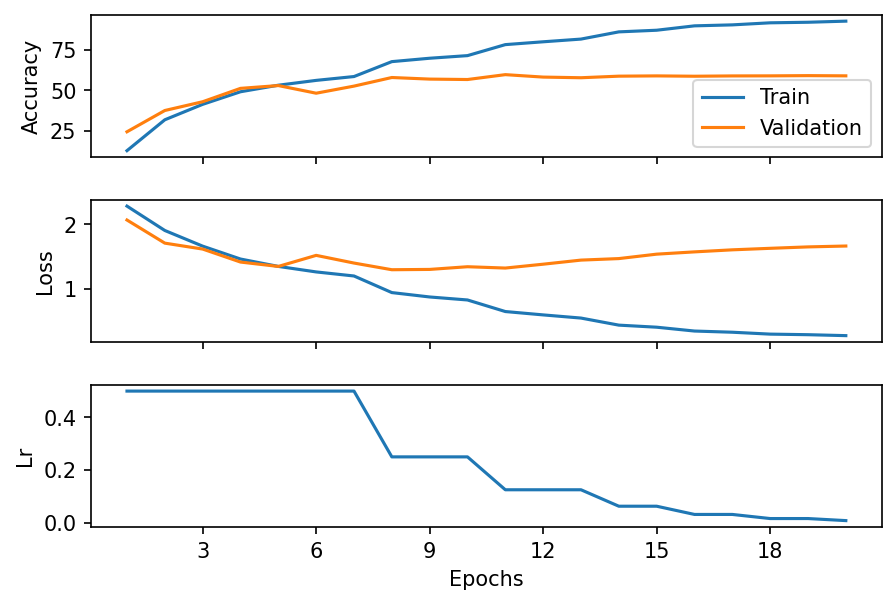

In [24]:
history.display(display_lr=True)

## Partie 3: Batch Normalization

Voici l'architecture du réseau de neurones convolutionnels que vous avez utilisé jusqu'à présent pour faire de la classification sur Cifar10.

In [25]:
import torch.nn.functional as F

"""
class CifarNetBatchNorm(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 10, 3, padding=1)
        self.conv2 = nn.Conv2d(10, 50, 3, padding=1)
        self.conv3 = nn.Conv2d(50, 150, 3, padding=1)
        self.fc1 = nn.Linear(150 * 8 * 8, 10)

    def forward(self, x):
        x = F.max_pool2d(F.relu(self.conv1(x)), (2, 2))
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        x = F.relu(self.conv3(x))
        x = x.flatten(1)
        x = self.fc1(x)
        return x
"""

class CifarNetBatchNorm(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 10, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(10)
        self.conv2 = nn.Conv2d(10, 50, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(50)
        self.conv3 = nn.Conv2d(50, 150, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(150)
        self.fc1 = nn.Linear(150 * 8 * 8, 10)

    def forward(self, x):
        x = F.max_pool2d(F.relu(self.bn1(self.conv1(x))), (2, 2))
        x = F.max_pool2d(F.relu(self.bn2(self.conv2(x))), 2)
        x = F.relu(self.bn3(self.conv3(x)))
        x = x.flatten(1)
        x = self.fc1(x)
        return x

#### Exercice

- Modifier l'architecture du réseau en ajoutant de la batch normalization entre les couches de convolutions et les ReLUs (essentiellement, on devait avoir `Conv2d -> BatchNorm2d -> ReLU`) et entraîner le nouveau réseau.

Epoch: 1/5 Train steps: 313 Val steps: 79 5.73s loss: 1.581675 acc: 44.295000 val_loss: 1.709922 val_acc: 44.730000
Epoch: 2/5 Train steps: 313 Val steps: 79 5.83s loss: 1.177763 acc: 58.505000 val_loss: 1.874710 val_acc: 42.650000
Epoch: 3/5 Train steps: 313 Val steps: 79 5.78s loss: 1.028664 acc: 63.952500 val_loss: 1.826455 val_acc: 43.820000
Epoch: 4/5 Train steps: 313 Val steps: 79 5.73s loss: 0.925886 acc: 67.755000 val_loss: 1.441210 val_acc: 53.760000
Epoch: 5/5 Train steps: 313 Val steps: 79 5.72s loss: 0.859617 acc: 70.300000 val_loss: 3.305336 val_acc: 26.220000


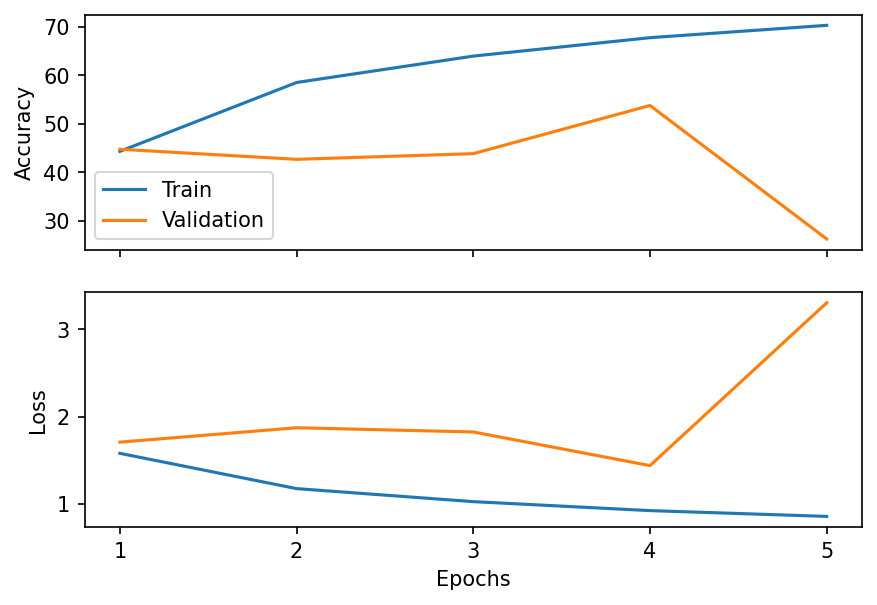

In [26]:
model = CifarNetBatchNorm()
model.cuda()

lr = 0.01
batch_size = 128
n_epoch = 5

optimizer = optim.SGD(model.parameters(), lr=lr)

history = train(model, optimizer, cifar_train, n_epoch, batch_size, use_gpu=True)
history.display()

#### Questions

- Comparer l'entraînement du réseau avec et sans la batch normalization (Section 1.2 avec SGD, où on a entraîné le réseau sans batch normalization avec le même taux d'apprentissage). Que remarquez-vous? 

    **On remarque une amélioration des résultats ainsi qu'un surapprentissage plus grand.**

### Effet de la batch normalization sur le taux d'apprentissage

Commençons par entraîner un réseau avec un taux d'apprentissage élevé. Vous pouvez augmenter le nombre d'epochs si vous voulez voir une plus grande différence.

In [27]:
lr = 0.5
batch_size = 1024
n_epoch = 5

In [28]:
model = CifarNet()
model.cuda()
optimizer = optim.SGD(model.parameters(), lr=lr)

history = train(model, optimizer, cifar_train, n_epoch, batch_size, use_gpu=True)

Epoch: 1/5 Train steps: 40 Val steps: 10 5.01s loss: 2.344776 acc: 13.955000 val_loss: 2.308083 val_acc: 11.650000
Epoch: 2/5 Train steps: 40 Val steps: 10 4.99s loss: 2.326586 acc: 11.037500 val_loss: 2.307570 val_acc: 10.110000
Epoch: 3/5 Train steps: 40 Val steps: 10 5.01s loss: 2.311844 acc: 12.072500 val_loss: 2.306177 val_acc: 9.670000
Epoch: 4/5 Train steps: 40 Val steps: 10 5.10s loss: 2.303265 acc: 9.885000 val_loss: 2.303662 val_acc: 10.330000
Epoch: 5/5 Train steps: 40 Val steps: 10 5.06s loss: 2.303188 acc: 9.730000 val_loss: 2.304848 val_acc: 9.930000


Essayons maintenant d'entraîner le réseau utilisant la batch normalization avec les mêmes hyperparamètres.

In [29]:
model = CifarNetBatchNorm()
model.cuda()
optimizer = optim.SGD(model.parameters(), lr=lr)

history = train(model, optimizer, cifar_train, n_epoch, batch_size, use_gpu=True)

Epoch: 1/5 Train steps: 40 Val steps: 10 5.27s loss: 5.076865 acc: 18.375000 val_loss: 2.115641 val_acc: 21.100000
Epoch: 2/5 Train steps: 40 Val steps: 10 5.36s loss: 2.018809 acc: 27.277500 val_loss: 2.016967 val_acc: 26.250000
Epoch: 3/5 Train steps: 40 Val steps: 10 5.23s loss: 1.859162 acc: 32.710000 val_loss: 1.886772 val_acc: 31.560000
Epoch: 4/5 Train steps: 40 Val steps: 10 5.25s loss: 1.731942 acc: 36.877500 val_loss: 2.074787 val_acc: 28.750000
Epoch: 5/5 Train steps: 40 Val steps: 10 5.34s loss: 1.660176 acc: 39.495000 val_loss: 1.884399 val_acc: 31.350000


#### Questions
- Que pouvez-vous conclure sur l'effet de la batch normalization sur le taux d'apprentissage? 

    **Les résultats peuvent varier mais, généralement parlant, la batch normalization permet d'apprendre avec un taux d'apprentissage plus élevé.**

### Analyse

Après l'entraînement, il est important d'analyser les résultats obtenus.
Commençons par tester le réseau en utilisant la fonction `validate_ranking`.
Cette fonction sépare les résultats bien classés des erreurs et retourne pour chaque image, un score (qu'on peut voir comme une probabilité), la vraie classe et la classe prédite.

In [30]:
good, errors = validate_ranking(model, cifar_test, batch_size, use_gpu=True)

Maintenant, regardons quelques exemples d'images bien classés.

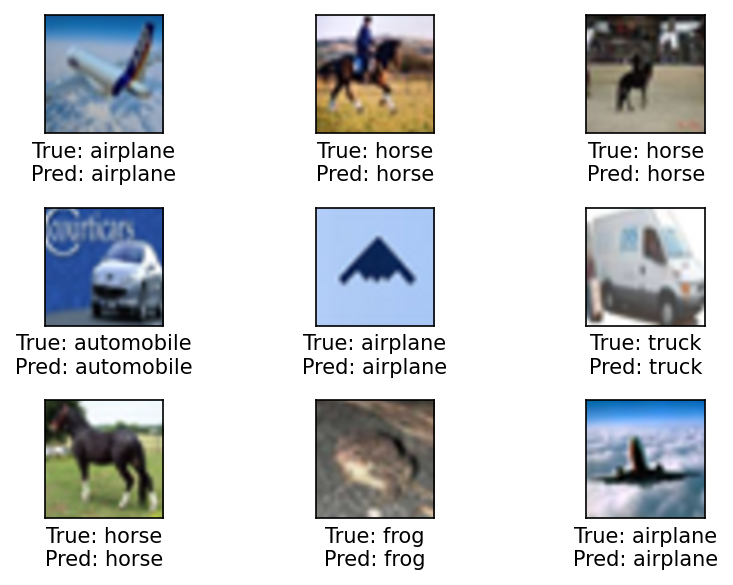

In [31]:
show_random(good)

Et quelques exemples mal classés.

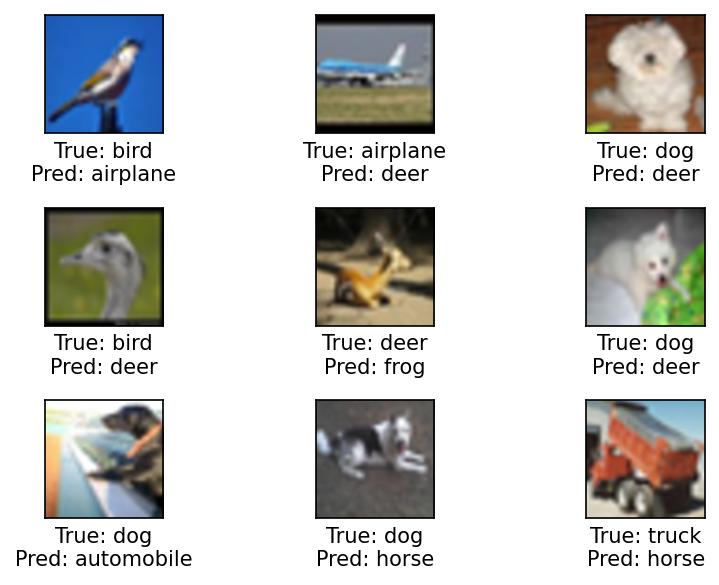

In [32]:
show_random(errors)

Il est aussi possible de regarder les exemples où le réseau est le plus confiant.

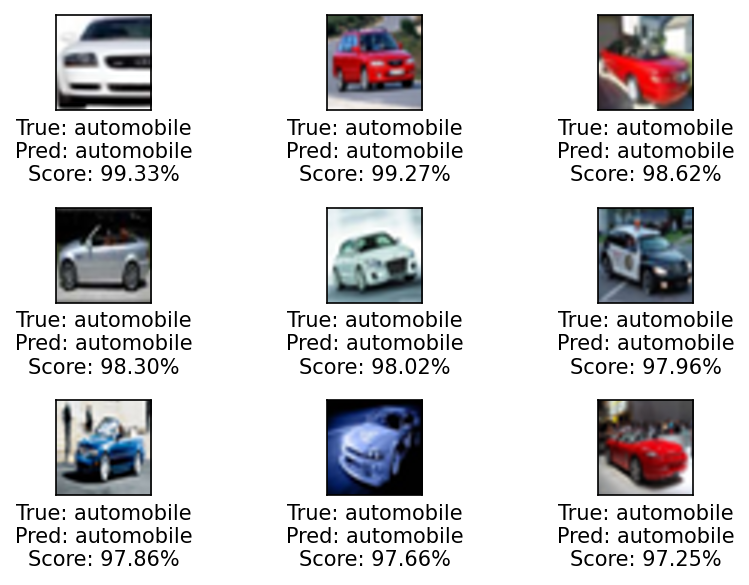

In [33]:
show_best(good)

Ou l'inverse, ceux qui ont obtenus les moins bons scores.

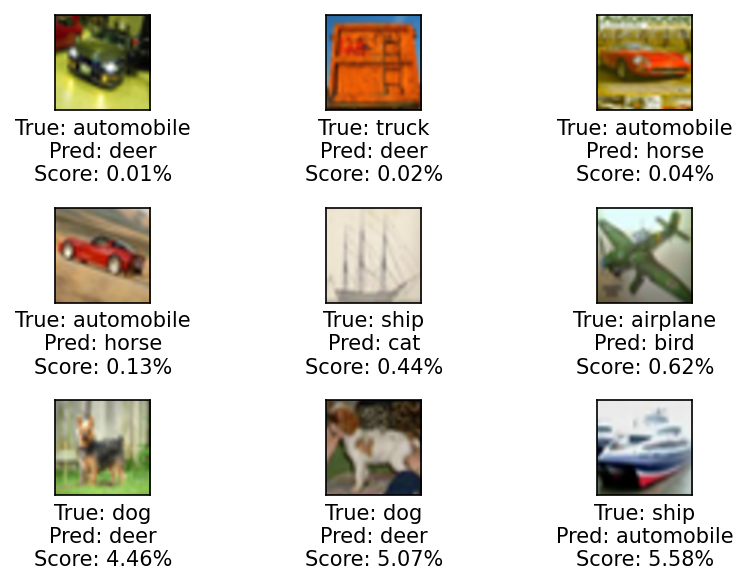

In [34]:
show_worst(errors)

Finalement, il peut être intéressant de regarder les exemples les plus difficiles.
Soit ceux qui ont été bien classés, mais qui ont eu un mauvais score.

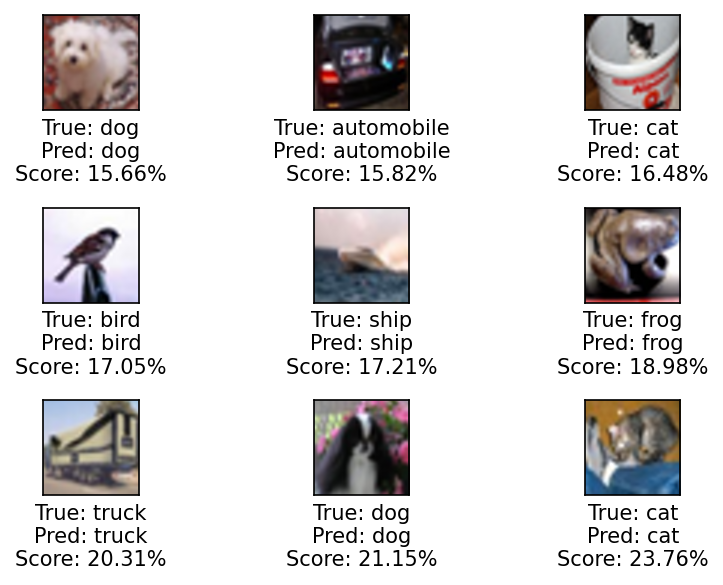

In [35]:
show_worst(good)

Ou ceux qui ont été mal classés, mais qui ont quand même réussi à obtenir un bon score.

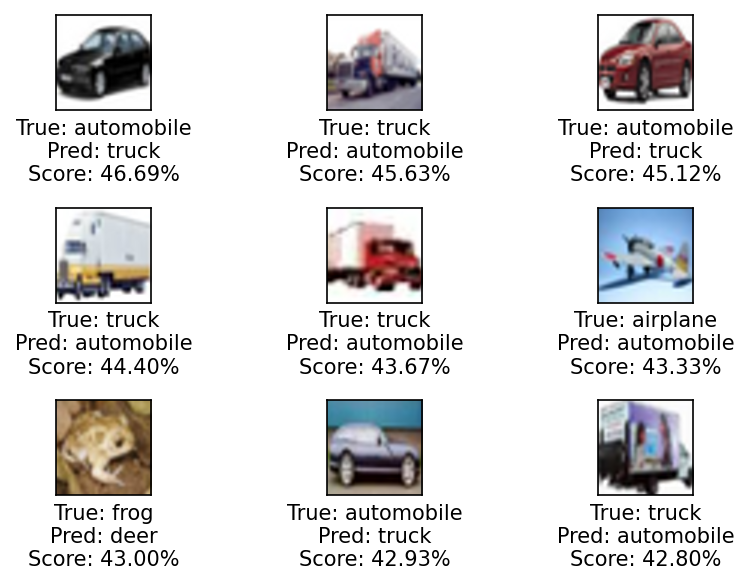

In [36]:
show_best(errors)

#### Questions 
- En observant les résultats obtenus, que pouvez-vous dire sur les performances du réseau? 

    **La réponse à cette question va vraiment dépendre du minimum local qui a été atteint par le réseau. C'est possible que le réseau ait très bien appris certaines classes mais que d'autres aient été délaissées.**

- Quelle classe semble être facile? Pourquoi? 

    **Étant donné que l'exécution va varier, nous donnons ici seulement un exemple de réponse sans lien avec l'exécution montré dans ce solutionnaire. Par exemple, il se pourrait que le réseau se soit concentré sur les avions. La présence des ailes d'un avion en plus du ciel aide possiblement le réseau à faire sa tâche.**

- Quelle classe semble être difficile? Pourquoi? 

    **Encore une fois, étant donné que l'exécution va varier, nous donnons ici seulement un exemple de réponse sans lien avec l'exécution montré dans ce solutionnaire. Par exemple, il se pourrait que le réseau ait beaucoup de difficulté à différencier les avions des bateaux. Ceci pourrait être possiblement dû au fait que l'arrière-plan des deux classes est souvent bleu comme le ciel et la mer.**

## Partie 4: Initialisation des poids

Dans cette section, vous testerez différentes techniques d'initialisations et observerez leurs effets sur le gradient et l'entraînement.

In [37]:
cifar_train, cifar_test = load_cifar10()
cifar_train.transform = ToTensor()
cifar_test.transform = ToTensor()

train_loader, valid_loader = train_valid_loaders(cifar_train, 10)

Files already downloaded and verified
Files already downloaded and verified


On crée ici un réseau de neurones assez simple composé de 5 couches cachées (6 couches au total) et avec un choix pour la fonction d'activation.

In [38]:
activations = dict(
    tanh=nn.Tanh,
    relu=nn.ReLU
)

def create_fully_connected_network(activation):
    assert activation in activations
    activation = activations[activation]
    num_neurons = 1000
    return nn.Sequential(
        nn.Flatten(),
        nn.Linear(32*32*3, num_neurons),
        activation(),
        nn.Linear(num_neurons, num_neurons),
        activation(),
        nn.Linear(num_neurons, num_neurons),
        activation(),
        nn.Linear(num_neurons, num_neurons),
        activation(),
        nn.Linear(num_neurons, num_neurons),
        activation(),
        nn.Linear(num_neurons, 10)
    )

On va jouer avec différentes fonctions d'initialisation. Créons donc une fonction nous permettant d'initialiser tous les poids de notre réseau de neurones.

In [39]:
def initialize_network(network, initialization_function):
    for module in network.modules():
        if isinstance(module, nn.Linear):
            initialization_function(module.weight)
            init.zeros_(module.bias)

On s'intéresse aux gradients qui circulent dans le réseau de neurones lors de la rétropropagation. Ceci est à distinguer du gradient calculé pour chacun des poids individuels du réseau de neurones. Le gradient circulant pendant la rétropropagation nous donne une idée de la possibilité de changements des poids de la couche en question. De manière équivalente, le gradient qui circule dans le réseau est le même que celui des biais des couches linéaires. Les fonctions suivantes procèdent donc de la façon suivante:
- On parcourt le jeu de données d'entraînement en batch;
- Pour chacune des batchs, on garde pour chacune des couches le gradient des biais de la couche;
- Une fois que toutes les batchs ont été traitées, on calcule un histogramme des gradients pour chaque couche.

In [40]:
def save_gradient(sequential_network, output_dictionary):
    layer_number = 1
    for layer in sequential_network:
        if isinstance(layer, nn.Linear):
            # On ignore la dernière couche qui est la couche de 
            # classification.
            if layer_number == 6:
                continue

            with torch.no_grad():
                grad = layer.bias.grad.flatten().cpu().numpy()
            grad = grad[grad != 0]
            output_dictionary[layer_number].append(grad)
            layer_number += 1

def plot_gradients_per_layer(gradients_per_layer):
    for layer_number, grads in gradients_per_layer.items():
        grad = np.concatenate(grads)
        hist, bin_edges = np.histogram(grad, bins=100)
        hist = hist / hist.sum() * 100

        plt.plot(bin_edges[:-1], hist, label=f'Layer {layer_number}')

def plot_gradient(network):
    gradients_per_layer = defaultdict(list)
    network.cuda()
    for x, y in train_loader:
        x = x.cuda()
        y = y.cuda()
        
        output = network(x)
        loss = F.cross_entropy(output, y)
        loss.backward()
        
        save_gradient(network, gradients_per_layer)

        network.zero_grad(True)

    plot_gradients_per_layer(gradients_per_layer)
    plt.legend()

La fonction ci-dessous est la fonction qui est utilisée comme référence dans [l'article introduisant l'initialisation Glorot/Xavier](http://proceedings.mlr.press/v9/glorot10a/glorot10a.pdf) et est d'ailleurs celle utilisé par PyTorch par défaut dans les couches linéaires. Nous allons l'utiliser pour la comparer avec l'initialisation de Glorot/Xavier et celle de Kaiming He.

In [41]:
def standard_uniform(weight):
    bound = 1. / np.sqrt(weight.shape[1])
    init.uniform_(weight, -bound, bound)

### 4.1 Réseau avec activation tanh

La fonction tanh était la fonction d'activation la plus utilisée avant l'arrivée de la fonction ReLU. Plusieurs fonctions d'initialisation ont donc été conçues avec cette fonction d'activation en tête. Investiguons donc l'effet des différentes fonctions d'initialisation sur un réseau avec des activations tanh.

In [42]:
tanh_network = create_fully_connected_network('tanh')
tanh_network

Sequential(
  (0): Flatten(start_dim=1, end_dim=-1)
  (1): Linear(in_features=3072, out_features=1000, bias=True)
  (2): Tanh()
  (3): Linear(in_features=1000, out_features=1000, bias=True)
  (4): Tanh()
  (5): Linear(in_features=1000, out_features=1000, bias=True)
  (6): Tanh()
  (7): Linear(in_features=1000, out_features=1000, bias=True)
  (8): Tanh()
  (9): Linear(in_features=1000, out_features=1000, bias=True)
  (10): Tanh()
  (11): Linear(in_features=1000, out_features=10, bias=True)
)

Regardons l'histogramme des gradients lorsqu'on utilise l'initialisation standard (de référence).

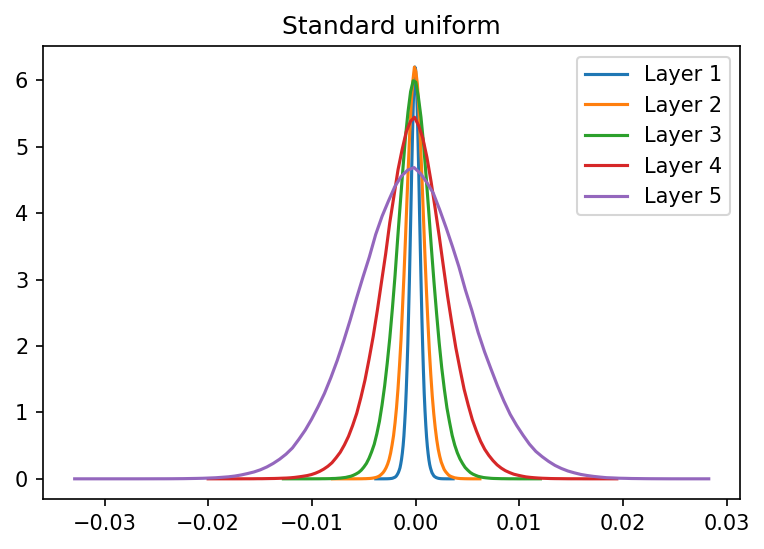

In [43]:
initialize_network(tanh_network, standard_uniform)

plot_gradient(tanh_network)
plt.title('Standard uniform')
plt.show()

Regardons l'histogramme des gradients lorsqu'on utilise l'initialisation de Glorot/Xavier.

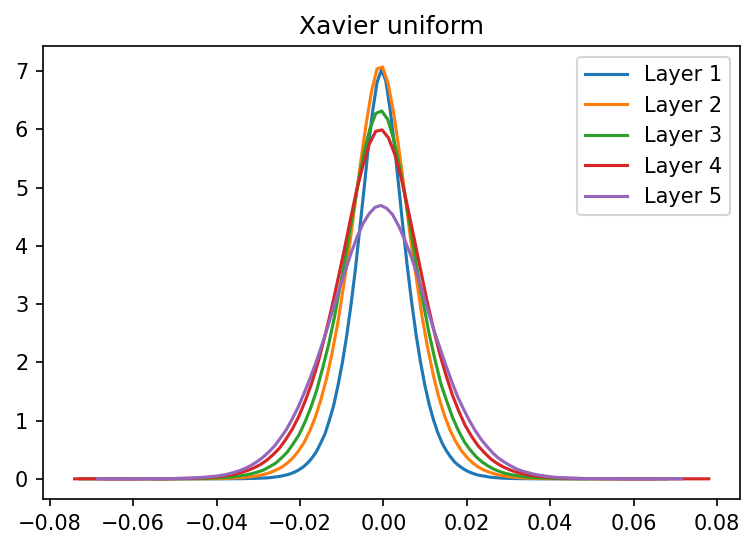

In [44]:
initialize_network(tanh_network, init.xavier_uniform_)

plot_gradient(tanh_network)
plt.title('Xavier uniform')
plt.show()

Regardons l'histogramme des gradients lorsqu'on utilise l'initialisation de Kaiming He.

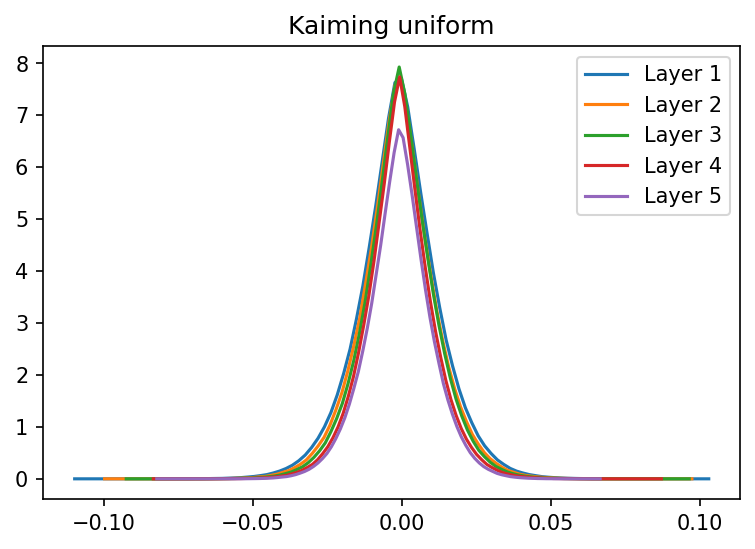

In [45]:
initialize_network(tanh_network, init.kaiming_uniform_)

plot_gradient(tanh_network)
plt.title('Kaiming uniform')
plt.show()

#### Questions
- À partir des graphiques pour chacune des fonctions d'initialisation, que peut-on dire sur la différence d'initialisation entre les différents types d'initialisation? **Pour l'activation standard, on peut voir que la différence entre les variances de chacune des couches est plus grande pour les couches plus près de la sortie du réseau que de celle plus près de l'entrée du réseau. Avec les initialisations Xavier et Glorot, on peut voir que cette différence est amoindrie.**
- Intuitivement, pourquoi serait-il préférable d'avoir une variance similaire pour le gradient circulant dans chacune des couches? **On pourrait argumenter que d'avoir une variance similaire permet à chacune des couches d'apprendre à la même vitesse.**

Maintenant que l'on a observé l'effet de l'initialisation sur le gradient circulant dans le réseau, regardons si l'effet est répercuté sur l'apprentissage.

In [46]:
batch_size = 128
epochs = 5

Entraînons le réseau avec l'initialisation standard.

Epoch: 1/5 Train steps: 313 Val steps: 79 5.13s loss: 2.285281 acc: 14.485000 val_loss: 2.258587 val_acc: 20.490000
Epoch: 2/5 Train steps: 313 Val steps: 79 5.12s loss: 2.169637 acc: 22.930000 val_loss: 2.085619 val_acc: 24.670000
Epoch: 3/5 Train steps: 313 Val steps: 79 5.18s loss: 2.043110 acc: 25.662500 val_loss: 2.007731 val_acc: 27.900000
Epoch: 4/5 Train steps: 313 Val steps: 79 5.17s loss: 1.976247 acc: 28.102500 val_loss: 1.945059 val_acc: 29.290000
Epoch: 5/5 Train steps: 313 Val steps: 79 5.17s loss: 1.924680 acc: 30.627500 val_loss: 1.916812 val_acc: 30.870000


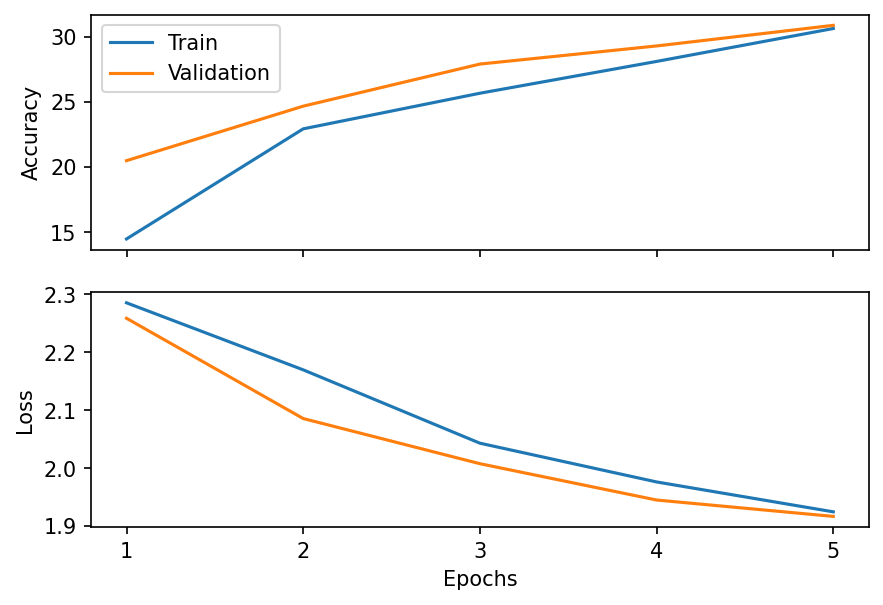

Test steps: 79 0.95s test_loss: 1.917100 test_acc: 30.330000                                                
Exactitude en test: 30.33


In [47]:
initialize_network(tanh_network, standard_uniform)

history = train(tanh_network, 'sgd', cifar_train, epochs, batch_size)
history.display()
print('Exactitude en test: {:.2f}'.format(test(tanh_network, cifar_test, batch_size)))

Regardons maintenant l'histogramme des gradients du réseau entraîné avec l'initialisation standard.

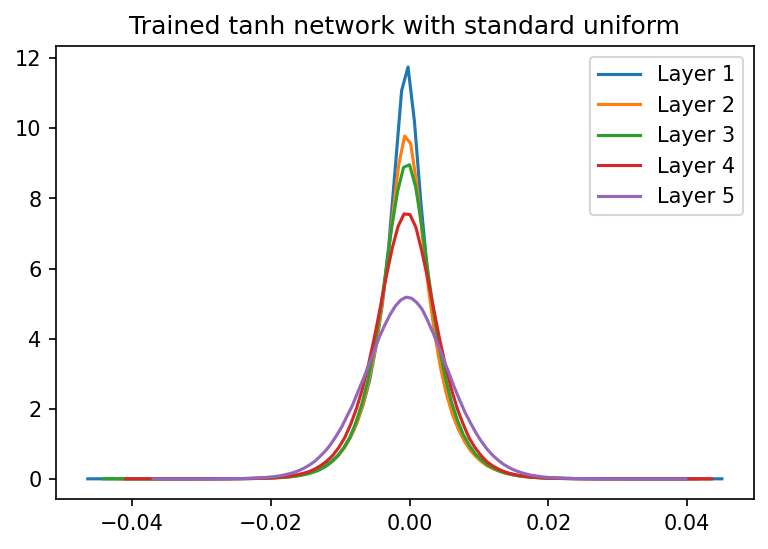

In [48]:
plot_gradient(tanh_network)
plt.title('Trained tanh network with standard uniform')
plt.show()

#### Questions
- Quelle différence remarquez-vous par rapport à l'histogramme du gradient circulant de l'initialisation standard avant l'entraînement (Voir le graphique "Standard uniform" plus haut) ? **On remarque que l'entraînement a eu pour effet de réduire la différence de variances entre les couches.**

Entraînons le réseau avec l'initialisation Xavier.

Epoch: 1/5 Train steps: 313 Val steps: 79 5.20s loss: 1.932646 acc: 30.877500 val_loss: 1.928442 val_acc: 29.950000
Epoch: 2/5 Train steps: 313 Val steps: 79 5.24s loss: 1.796831 acc: 36.547500 val_loss: 1.848835 val_acc: 33.710000
Epoch: 3/5 Train steps: 313 Val steps: 79 5.21s loss: 1.754980 acc: 38.082500 val_loss: 1.763725 val_acc: 36.880000
Epoch: 4/5 Train steps: 313 Val steps: 79 5.24s loss: 1.718290 acc: 39.577500 val_loss: 1.832424 val_acc: 34.050000
Epoch: 5/5 Train steps: 313 Val steps: 79 5.23s loss: 1.678311 acc: 41.155000 val_loss: 1.759519 val_acc: 37.380000


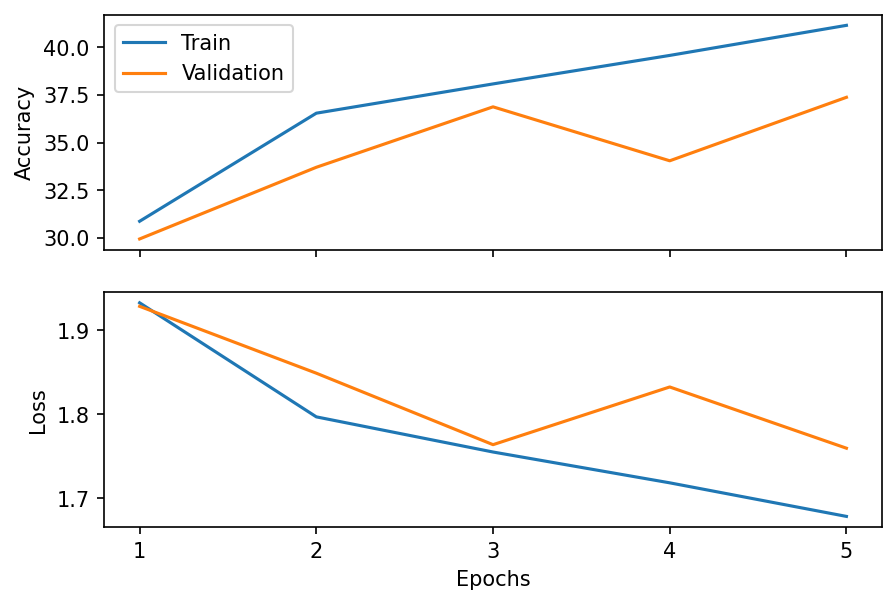

Test steps: 79 0.91s test_loss: 1.745133 test_acc: 36.780000                                                
Exactitude en test: 36.78


In [49]:
initialize_network(tanh_network, init.xavier_uniform_)

history = train(tanh_network, 'sgd', cifar_train, epochs, batch_size)
history.display()
print('Exactitude en test: {:.2f}'.format(test(tanh_network, cifar_test, batch_size)))

Regardons maintenant l'histogramme des gradients du réseau entraîné avec l'initialisation Xavier.

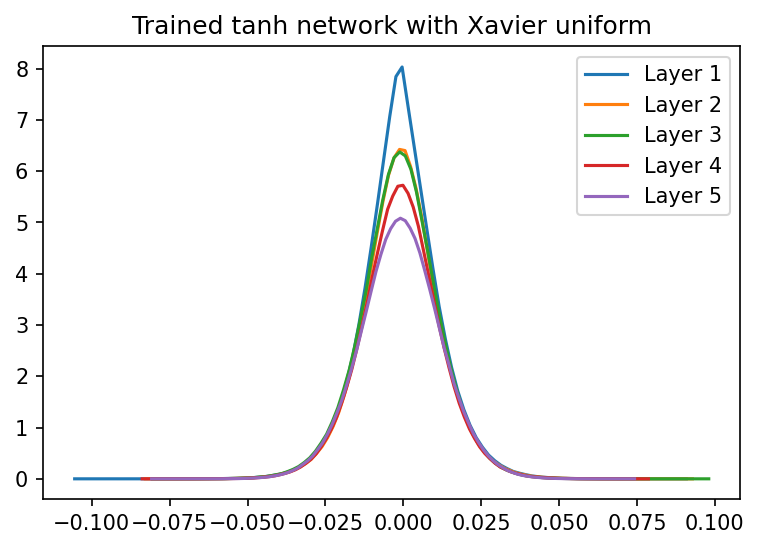

In [50]:
plot_gradient(tanh_network)
plt.title('Trained tanh network with Xavier uniform')
plt.show()

Entraînons le réseau avec l'initialisation Kaiming.

Epoch: 1/5 Train steps: 313 Val steps: 79 5.25s loss: 1.952578 acc: 30.290000 val_loss: 1.810947 val_acc: 34.170000
Epoch: 2/5 Train steps: 313 Val steps: 79 5.17s loss: 1.731895 acc: 38.427500 val_loss: 1.754160 val_acc: 38.240000
Epoch: 3/5 Train steps: 313 Val steps: 79 5.17s loss: 1.634687 acc: 42.002500 val_loss: 1.690586 val_acc: 39.270000
Epoch: 4/5 Train steps: 313 Val steps: 79 5.21s loss: 1.577973 acc: 44.037500 val_loss: 1.599026 val_acc: 42.850000
Epoch: 5/5 Train steps: 313 Val steps: 79 5.15s loss: 1.525442 acc: 46.202500 val_loss: 1.586222 val_acc: 41.910000


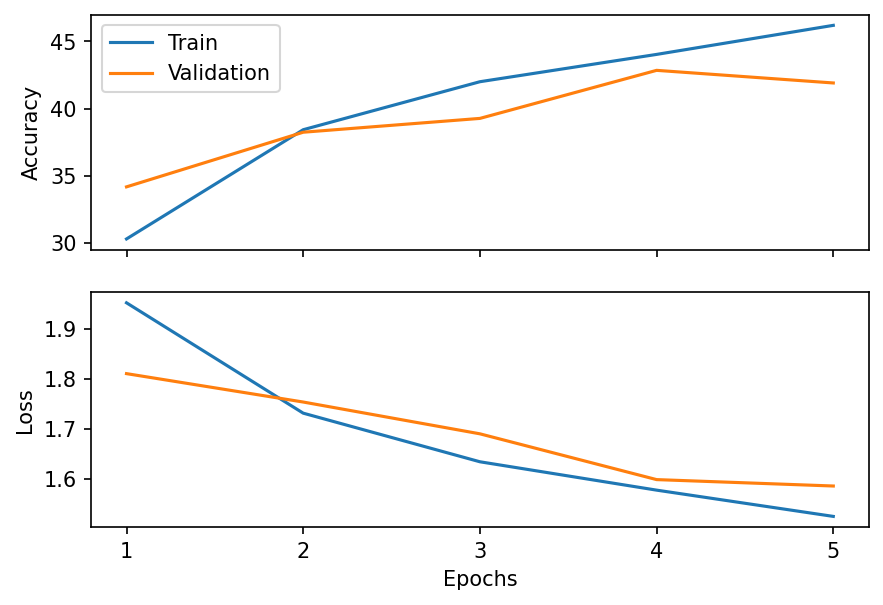

Test steps: 79 0.90s test_loss: 1.566126 test_acc: 42.820000                                                
Exactitude en test: 42.82


In [51]:
initialize_network(tanh_network, init.kaiming_uniform_)

history = train(tanh_network, 'sgd', cifar_train, epochs, batch_size)
history.display()
print('Exactitude en test: {:.2f}'.format(test(tanh_network, cifar_test, batch_size)))

Regardons maintenant l'histogramme des gradients du réseau entraîné avec l'initialisation Kaiming.

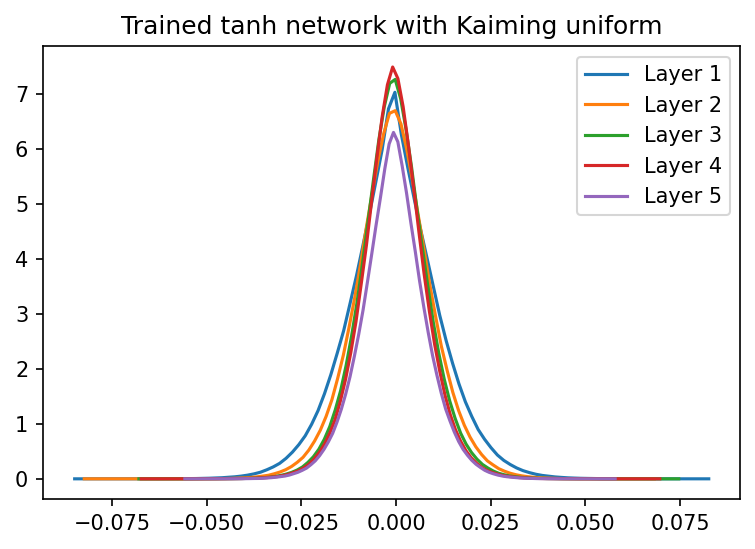

In [52]:
plot_gradient(tanh_network)
plt.title('Trained tanh network with Kaiming uniform')
plt.show()

#### Questions
- Que notez-vous en termes de performances des différentes techniques d'initialisation? **On remarque que les initialisations Xavier et Kaming offrent de meilleures performances.**
- Comparez les graphiques pour les initialisations Xavier et Kaiming avant et après entraînement. Que remarquez-vous ? **On remarque qu'il y a bien peu de différences entre avant et après l'entraînement, même s'il y en a une petite.**

### 4.2 Réseau avec activation ReLU

Effectuons donc le même processus mais c'est fois-ci avec la fonction ReLU. 

>Notons que la fonction calculant les histogrammes enlève tous les gradients qui sont exactement à zéro. Autrement, chaque histogramme aurait un grand pic à zéro nous empêchant de voir la distribution du reste des gradients.

In [53]:
relu_network = create_fully_connected_network('relu')
relu_network

Sequential(
  (0): Flatten(start_dim=1, end_dim=-1)
  (1): Linear(in_features=3072, out_features=1000, bias=True)
  (2): ReLU()
  (3): Linear(in_features=1000, out_features=1000, bias=True)
  (4): ReLU()
  (5): Linear(in_features=1000, out_features=1000, bias=True)
  (6): ReLU()
  (7): Linear(in_features=1000, out_features=1000, bias=True)
  (8): ReLU()
  (9): Linear(in_features=1000, out_features=1000, bias=True)
  (10): ReLU()
  (11): Linear(in_features=1000, out_features=10, bias=True)
)

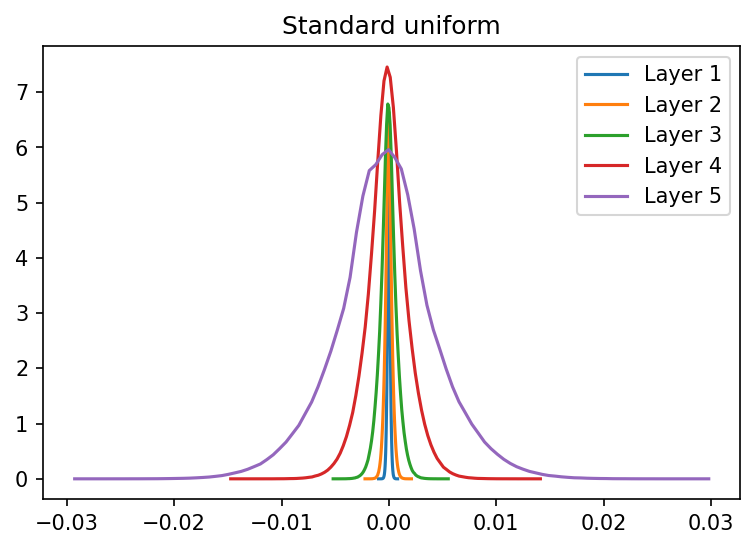

In [54]:
initialize_network(relu_network, standard_uniform)

plot_gradient(relu_network)
plt.title('Standard uniform')
plt.show()

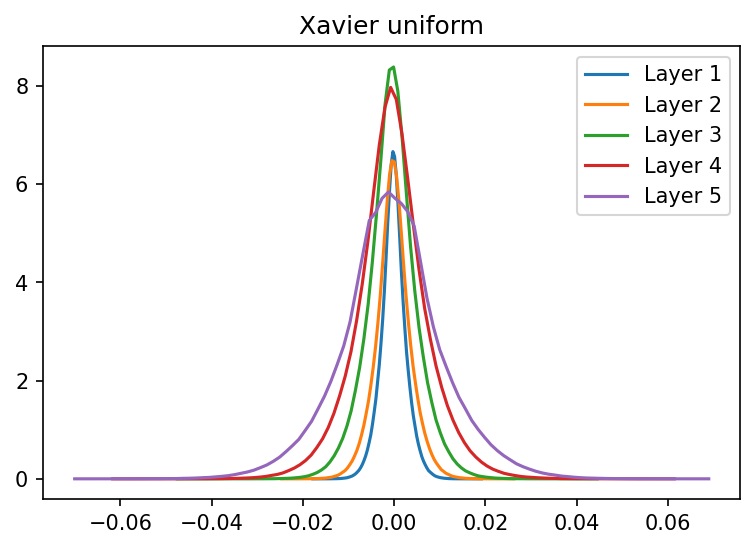

In [55]:
initialize_network(relu_network, init.xavier_uniform_)

plot_gradient(relu_network)
plt.title('Xavier uniform')
plt.show()

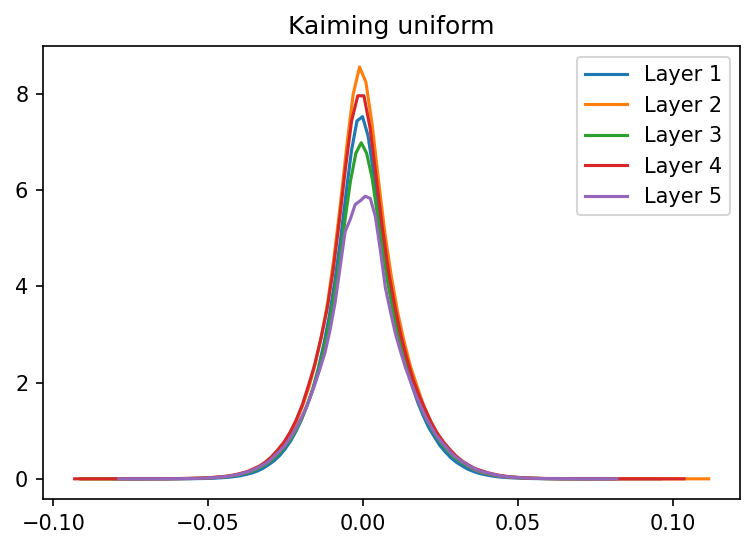

In [56]:
initialize_network(relu_network, init.kaiming_uniform_)

plot_gradient(relu_network)
plt.title('Kaiming uniform')
plt.show()

Effectuons les entraînements avec les différentes fonctions d'initialisation.

Epoch: 1/5 Train steps: 313 Val steps: 79 5.15s loss: 2.301636 acc: 11.240000 val_loss: 2.300711 val_acc: 12.980000
Epoch: 2/5 Train steps: 313 Val steps: 79 5.18s loss: 2.299473 acc: 14.237500 val_loss: 2.298086 val_acc: 17.800000
Epoch: 3/5 Train steps: 313 Val steps: 79 5.13s loss: 2.295490 acc: 16.090000 val_loss: 2.292196 val_acc: 16.950000
Epoch: 4/5 Train steps: 313 Val steps: 79 5.21s loss: 2.284578 acc: 15.515000 val_loss: 2.273438 val_acc: 15.470000
Epoch: 5/5 Train steps: 313 Val steps: 79 5.19s loss: 2.242640 acc: 15.792500 val_loss: 2.196684 val_acc: 17.810000


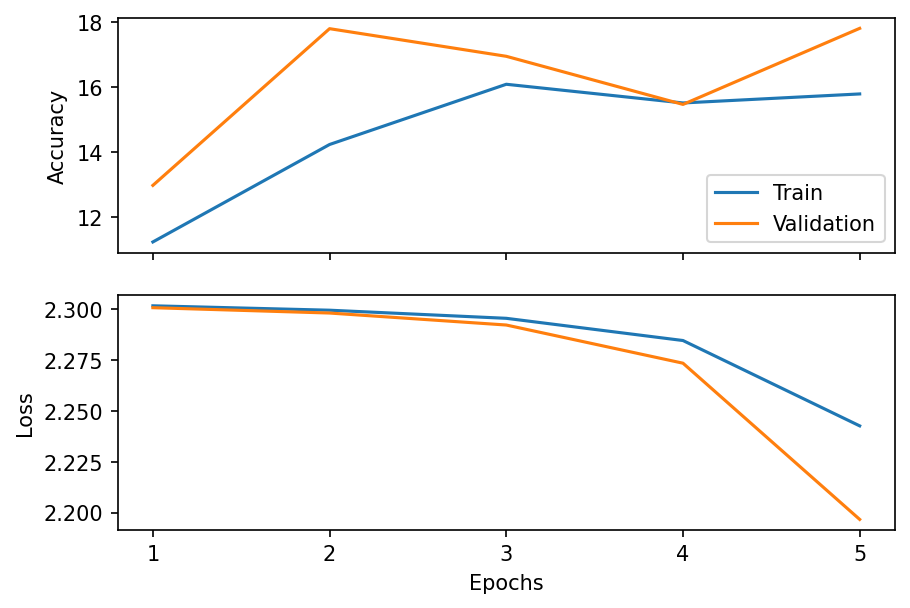

Test steps: 79 0.91s test_loss: 2.195949 test_acc: 17.260000                                                
Exactitude en test: 17.26


In [57]:
initialize_network(relu_network, standard_uniform)

history = train(relu_network, 'sgd', cifar_train, epochs, batch_size)
history.display()
print('Exactitude en test: {:.2f}'.format(test(relu_network, cifar_test, batch_size)))

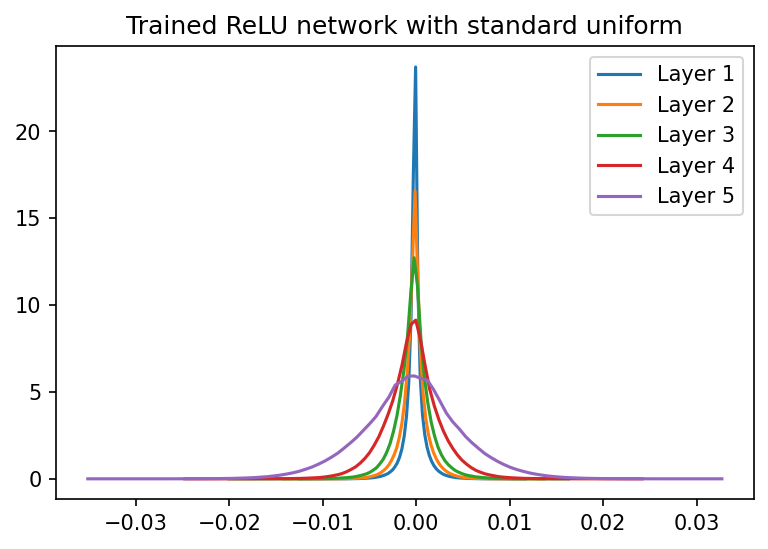

In [58]:
plot_gradient(relu_network)
plt.title('Trained ReLU network with standard uniform')
plt.show()

Epoch: 1/5 Train steps: 313 Val steps: 79 5.26s loss: 2.059025 acc: 26.830000 val_loss: 1.896258 val_acc: 31.010000
Epoch: 2/5 Train steps: 313 Val steps: 79 5.28s loss: 1.856526 acc: 34.037500 val_loss: 1.835798 val_acc: 34.520000
Epoch: 3/5 Train steps: 313 Val steps: 79 5.33s loss: 1.773034 acc: 37.100000 val_loss: 1.820903 val_acc: 35.210000
Epoch: 4/5 Train steps: 313 Val steps: 79 5.24s loss: 1.713604 acc: 39.360000 val_loss: 1.700049 val_acc: 39.250000
Epoch: 5/5 Train steps: 313 Val steps: 79 5.21s loss: 1.671199 acc: 40.977500 val_loss: 1.984972 val_acc: 31.730000


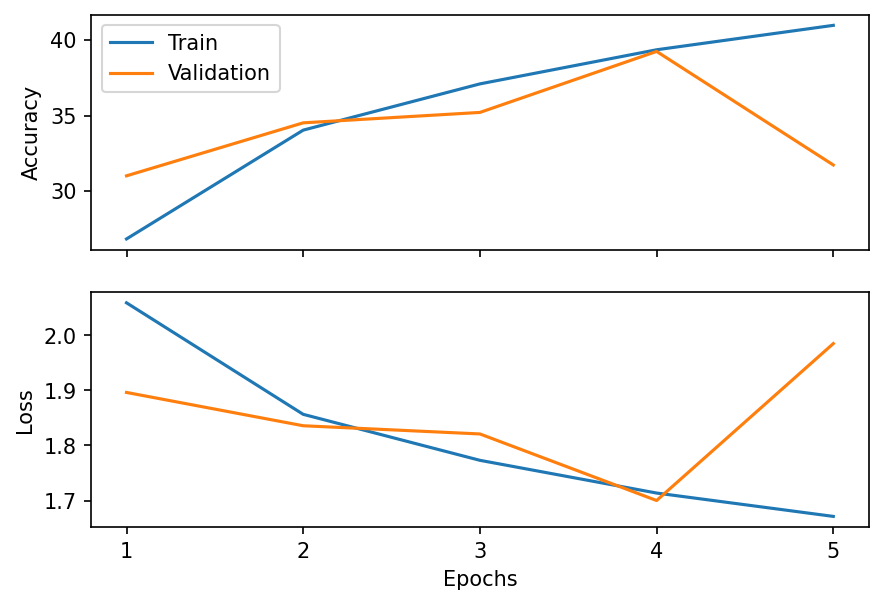

Test steps: 79 0.92s test_loss: 1.994950 test_acc: 31.900000                                                
Exactitude en test: 31.90


In [59]:
initialize_network(relu_network, init.xavier_uniform_)

history = train(relu_network, 'sgd', cifar_train, epochs, batch_size)
history.display()
print('Exactitude en test: {:.2f}'.format(test(relu_network, cifar_test, batch_size)))

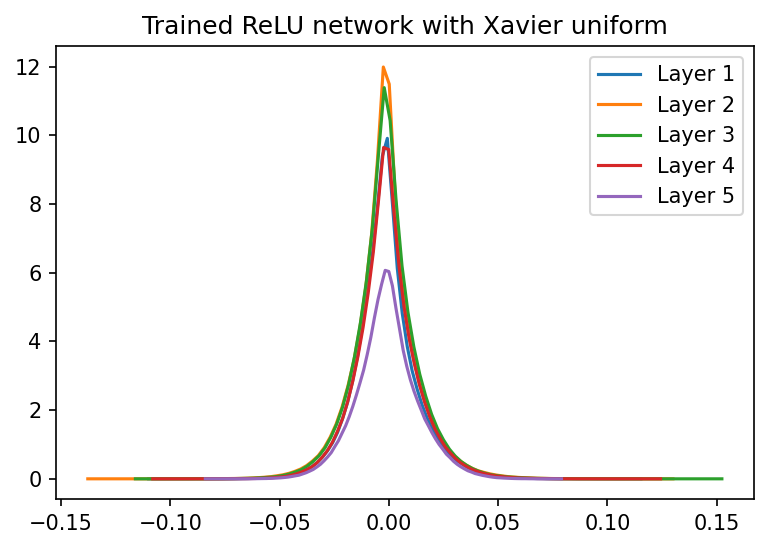

In [60]:
plot_gradient(relu_network)
plt.title('Trained ReLU network with Xavier uniform')
plt.show()

Epoch: 1/5 Train steps: 313 Val steps: 79 5.22s loss: 1.927859 acc: 30.615000 val_loss: 1.788095 val_acc: 36.420000
Epoch: 2/5 Train steps: 313 Val steps: 79 5.26s loss: 1.729129 acc: 38.635000 val_loss: 2.096492 val_acc: 30.110000
Epoch: 3/5 Train steps: 313 Val steps: 79 5.18s loss: 1.652617 acc: 41.522500 val_loss: 1.707357 val_acc: 39.010000
Epoch: 4/5 Train steps: 313 Val steps: 79 5.32s loss: 1.590106 acc: 44.090000 val_loss: 1.698670 val_acc: 39.100000
Epoch: 5/5 Train steps: 313 Val steps: 79 5.22s loss: 1.552428 acc: 45.392500 val_loss: 1.678084 val_acc: 41.210000


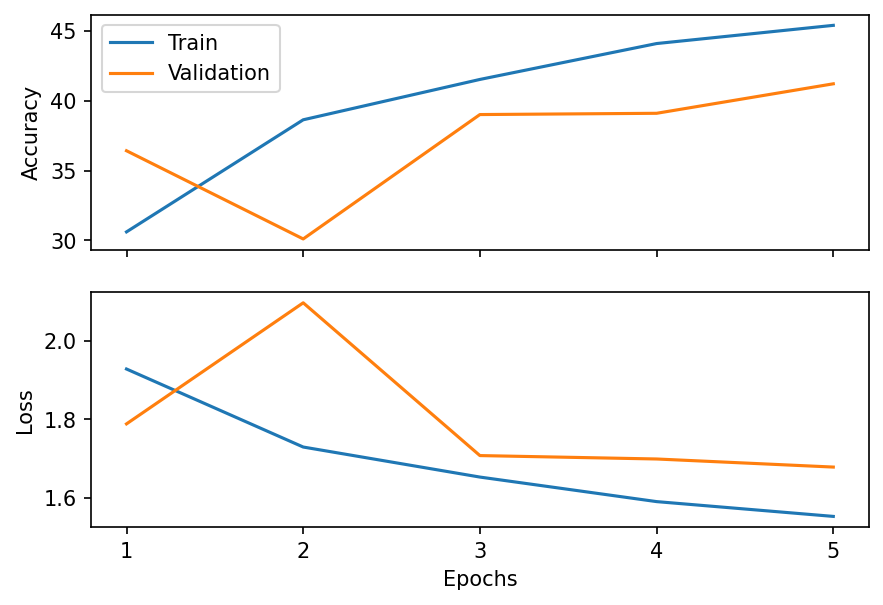

Test steps: 79 0.93s test_loss: 1.664291 test_acc: 42.190000                                                
Exactitude en test: 42.19


In [61]:
initialize_network(relu_network, init.kaiming_uniform_)

history = train(relu_network, 'sgd', cifar_train, epochs, batch_size)
history.display()
print('Exactitude en test: {:.2f}'.format(test(relu_network, cifar_test, batch_size)))

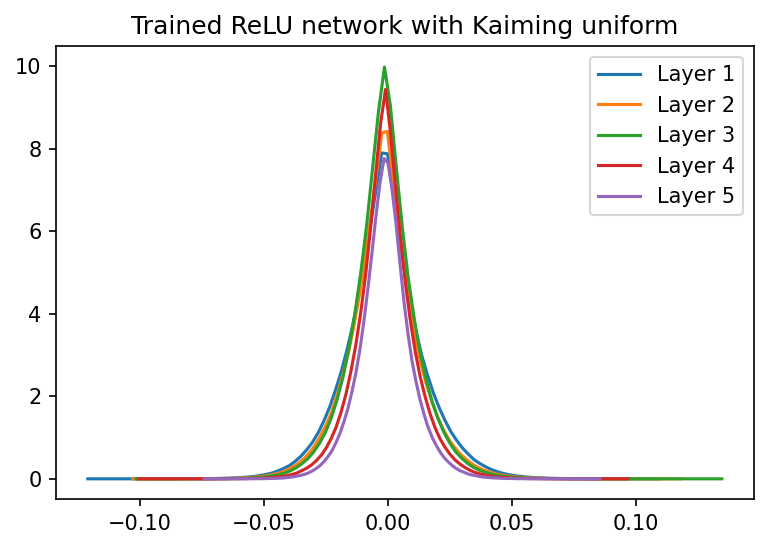

In [62]:
plot_gradient(relu_network)
plt.title('Trained ReLU network with Kaiming uniform')
plt.show()

#### Questions
- Quelles similarités remarquez-vous en termes de performance et de gradient entre le réseau avec activation tanh et le réseau avec activation ReLU?
  - **Les graphiques de gradient pour la tanh et la ReLU avant l'entraînement sont très similaires pour chaque fonction d'initialisation respective.**
  - **Peu importe la fonction d'activation, utiliser les activations Xavier et Kaiming ont aidé l'optimisation du réseau.**
- Quelles différences remarquez-vous en termes de performance et de gradient entre le réseau avec activation tanh et le réseau avec activation ReLU?
  - **L'activation standard a été moins performante dans le cas de la ReLU que de la tanh dans ce cas-ci.**